# CSE4062 Data Science - Delivery #4

## Göksel Tokur - 150116049

## Arda Bayram-150116029

## Gülnihal Erdem - 150319554

## İrem Seçmen - 170219006

In [4]:
import numpy as np
import re
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.preprocessing import LabelEncoder

In [5]:
# Read Data
df = pd.read_csv('../data/training.1600000.processed.noemoticon.csv', header=None, encoding='latin')
df.columns = ['label', 'id', 'date', 'query', 'user', 'tweet']

# Data reduction
df = df.drop(['id', 'date', 'query', 'user'], axis=1)

In [6]:
labels_dict = {0:'Negative', 2:'Neutral', 4:'Positive'}

def convert_labels(label):
    return labels_dict[label]

df.label = df.label.apply(lambda x: convert_labels(x))
df

,label,tweet
0,Negative,"@switchfoot http://twitpic.com/2y1zl - Awww, t..."
1,Negative,is upset that he can't update his Facebook by ...
2,Negative,@Kenichan I dived many times for the ball. Man...
3,Negative,my whole body feels itchy and like its on fire
4,Negative,"@nationwideclass no, it's not behaving at all...."
...,...,...
1599995,Positive,Just woke up. Having no school is the best fee...
1599996,Positive,TheWDB.com - Very cool to hear old Walt interv...
1599997,Positive,Are you ready for your MoJo Makeover? Ask me f...
1599998,Positive,Happy 38th Birthday to my boo of alll time!!! ...


Text(0.5, 1.0, 'Data Distribution')

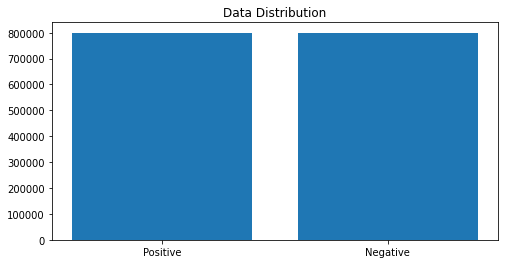

In [7]:
instances = df.label.value_counts()

plt.figure(figsize=(8,4))
plt.bar(instances.index, instances.values)
plt.title("Data Distribution")

## Preprocess

In [8]:
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk.stem import SnowballStemmer

stop_words = stopwords.words('english')
stemmer = SnowballStemmer('english')

punctuations_and_dummies = "@\S+|https?:\S+|http?:\S|[^A-Za-z0-9]+"



'''
def preprocess(df, will_be_stemmed=False):
    for index, row in df.iterrows():
        tweet = row.tweet
        tweet = re.sub(punctuations_and_dummies, ' ', str(tweet).lower()).strip()
        tokens = []
        for token in tweet.split():
            if token not in stop_words:
                if will_be_stemmed:
                    tokens.append(stemmer.stem(token))
                else:
                    tokens.append(token)
        df.tweet = " ".join(tokens)


preprocess(df.tweet)
'''


def preprocess(tweet, will_be_stemmed=False):
        tweet = re.sub(punctuations_and_dummies, ' ', str(tweet).lower()).strip()
        tokens = []
        for token in tweet.split():
            if token not in stop_words:
                if will_be_stemmed:
                    tokens.append(stemmer.stem(token))
                else:
                    tokens.append(token)
        return " ".join(tokens)
    
df.tweet = df.tweet.apply(lambda tw: preprocess(tw))

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\gokse\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [9]:
# Remove 0 length tweets
df = df[df.iloc[:,1].astype(str).str.len()!=0]

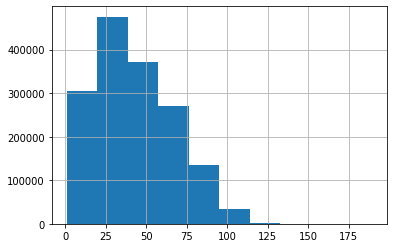

count    1.592328e+06
mean     4.279740e+01
std      2.415896e+01
min      1.000000e+00
25%      2.300000e+01
50%      3.900000e+01
75%      6.000000e+01
max      1.890000e+02
dtype: float64

In [10]:
tweets_len = [len(x) for x in df['tweet']]
pd.Series(tweets_len).hist()
plt.show()
pd.Series(tweets_len).describe()

### Number of Letters

In [11]:
all_str = ""
for i in df.tweet:
    all_str += i

In [12]:
from collections import Counter

letter_list = list(all_str)
my_counter = Counter(letter_list)

letter_df = pd.DataFrame.from_dict(my_counter, orient='index').reset_index()
letter_df = letter_df.rename(columns={'index':'letter', 0:'frequency'})
letter_df = letter_df.loc[letter_df['letter'].isin(['a','b','c','d','e','f','g','h','i','j','k','l','m','n','o','p','q','r','s','t','u','v','w','x','y','z'])]
letter_df['all_tweets_relative_freq']=letter_df['frequency']/letter_df['frequency'].sum()
letter_df = letter_df.sort_values('letter')

english = pd.read_csv('../data/letter_frequency_en_US.csv')
english['expected_relative_frequency'] = english['count']/english['count'].sum()
english = english.drop(['count'], axis=1)

letter_df = pd.merge(letter_df, english, on='letter')
letter_df['expected'] = np.round(letter_df['expected_relative_frequency']*letter_df['frequency'].sum(),0)
letter_df = letter_df.reset_index().drop(['index'], axis=1)
letter_df

,letter,frequency,all_tweets_relative_freq,expected_relative_frequency,expected
0,a,4547601,0.078816,0.081238,4687379.0
1,b,975326,0.016904,0.014893,859300.0
2,c,1705409,0.029557,0.027114,1564464.0
3,d,2289515,0.039680,0.043192,2492128.0
4,e,6471295,0.112156,0.120195,6935169.0
5,f,878849,0.015232,0.023039,1329304.0
6,g,2231747,0.038679,0.020257,1168838.0
7,h,2234047,0.038719,0.059215,3416628.0
8,i,3779579,0.065505,0.073054,4215160.0
9,j,143817,0.002493,0.001031,59502.0


<AxesSubplot:ylabel='letter'>

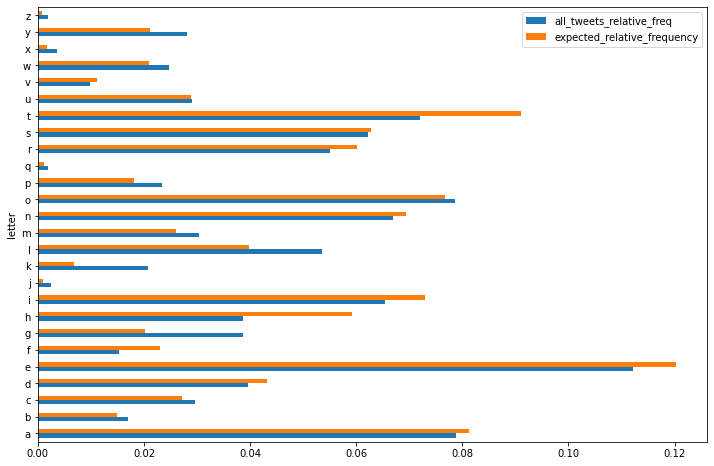

In [13]:
letter_df.plot(x="letter", y=["all_tweets_relative_freq", "expected_relative_frequency"], kind="barh", figsize=(12,8))

#### Compare the Observed Frequencies with the Expected Frequencies in English 

In [14]:
from scipy.stats import chi2_contingency
# Chi-square test of independence.
c, p, dof, expected = chi2_contingency(letter_df[['frequency', 'expected']])
p

0.0

We get that the p-value (p) is 0 which implies that the letter frequency does not follow the same distribution with what we see in English tests, although the Pearson correlation is too high (~96.7%).

In [15]:
letter_df[['frequency', 'expected']].corr()

,frequency,expected
frequency,1.000000,0.967421
expected,0.967421,1.000000


In [16]:
df1 = df.copy()

df1['number_of_characters'] = [len(tw) for tw in df1.tweet]
df1

,label,tweet,number_of_characters
0,Negative,awww bummer shoulda got david carr third day,44
1,Negative,upset update facebook texting might cry result...,69
2,Negative,dived many times ball managed save 50 rest go ...,52
3,Negative,whole body feels itchy like fire,32
4,Negative,behaving mad see,16
...,...,...,...
1599995,Positive,woke school best feeling ever,29
1599996,Positive,thewdb com cool hear old walt interviews,40
1599997,Positive,ready mojo makeover ask details,31
1599998,Positive,happy 38th birthday boo alll time tupac amaru ...,52


In [17]:
df1.number_of_characters.max()

189

In [18]:
df1.number_of_characters.min()

1

In [19]:
df1.number_of_characters.mean()

42.7974010379771

In [20]:
df1.number_of_characters.std()

24.158961650697616

## Number of Words

In [21]:
df1['number_of_words'] = [len(tw.split()) for tw in df1.tweet]
df1

,label,tweet,number_of_characters,number_of_words
0,Negative,awww bummer shoulda got david carr third day,44,8
1,Negative,upset update facebook texting might cry result...,69,11
2,Negative,dived many times ball managed save 50 rest go ...,52,10
3,Negative,whole body feels itchy like fire,32,6
4,Negative,behaving mad see,16,3
...,...,...,...,...
1599995,Positive,woke school best feeling ever,29,5
1599996,Positive,thewdb com cool hear old walt interviews,40,7
1599997,Positive,ready mojo makeover ask details,31,5
1599998,Positive,happy 38th birthday boo alll time tupac amaru ...,52,9


In [22]:
df1.number_of_words.max()

50

In [23]:
df1.number_of_words.min()

1

In [24]:
df1.number_of_words.mean()

7.244474128445898

In [25]:
df1.number_of_words.std()

4.030421805719796

### Positives + Negatives

<BarContainer object of 20 artists>

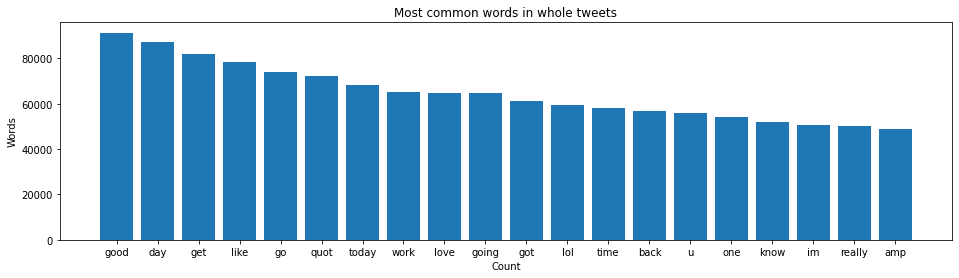

In [26]:
import collections
from wordcloud import WordCloud
from nltk import word_tokenize, sent_tokenize
from nltk.util import ngrams

all_tweets = ' '.join(df['tweet'].str.lower())

f_words = [word for word in all_tweets.split()]
counted_words = collections.Counter(f_words)

words = []
counts = []
for letter, count in counted_words.most_common(20):
    words.append(letter)
    counts.append(count)
    
plt.figure(figsize = (16, 4))
plt.title('Most common words in whole tweets')
plt.xlabel('Count')
plt.ylabel('Words')
plt.bar(words, counts)

### Positives

<BarContainer object of 20 artists>

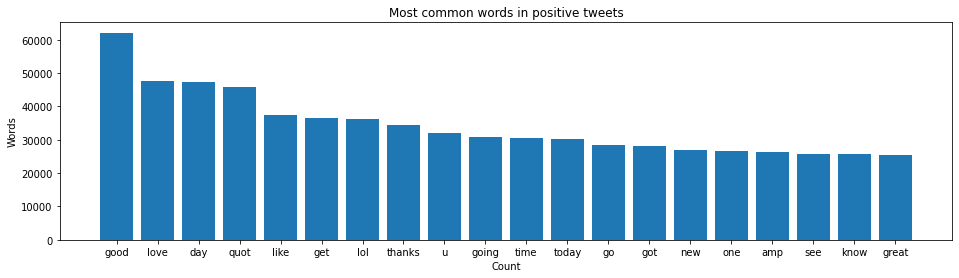

In [27]:
all_tweets = ' '.join(df[df.label == 'Positive'].tweet.str.lower())

f_words = [word for word in all_tweets.split()]
counted_words = collections.Counter(f_words)

words = []
counts = []
for letter, count in counted_words.most_common(20):
    words.append(letter)
    counts.append(count)
    
plt.figure(figsize = (16, 4))
plt.title('Most common words in positive tweets')
plt.xlabel('Count')
plt.ylabel('Words')
plt.bar(words, counts)

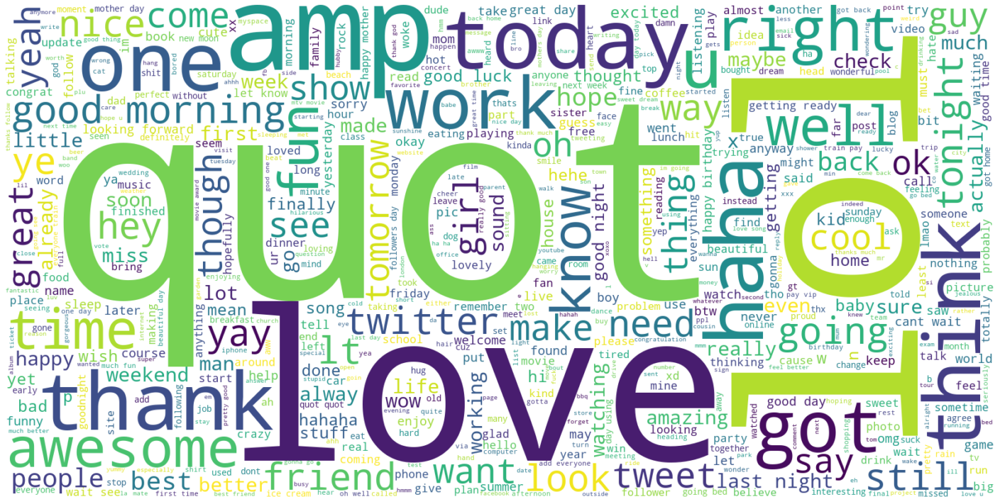

In [28]:
plt.figure(figsize = (25, 25))
plt.axis('off')
wordcloud_fig = WordCloud(max_words = 2000 , width = 1600 , height = 800, background_color ='white', min_font_size = 10).generate(" ".join(df[df.label == 'Positive'].tweet))
plt.imshow(wordcloud_fig, interpolation = 'bilinear')

### Negatives

<BarContainer object of 20 artists>

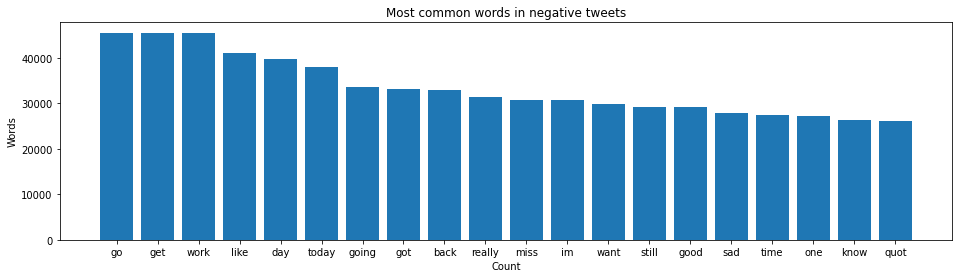

In [29]:
all_tweets = ' '.join(df[df.label == 'Negative'].tweet.str.lower())

f_words = [word for word in all_tweets.split()]
counted_words = collections.Counter(f_words)

words = []
counts = []
for letter, count in counted_words.most_common(20):
    words.append(letter)
    counts.append(count)
    
plt.figure(figsize = (16, 4))
plt.title('Most common words in negative tweets')
plt.xlabel('Count')
plt.ylabel('Words')
plt.bar(words, counts)

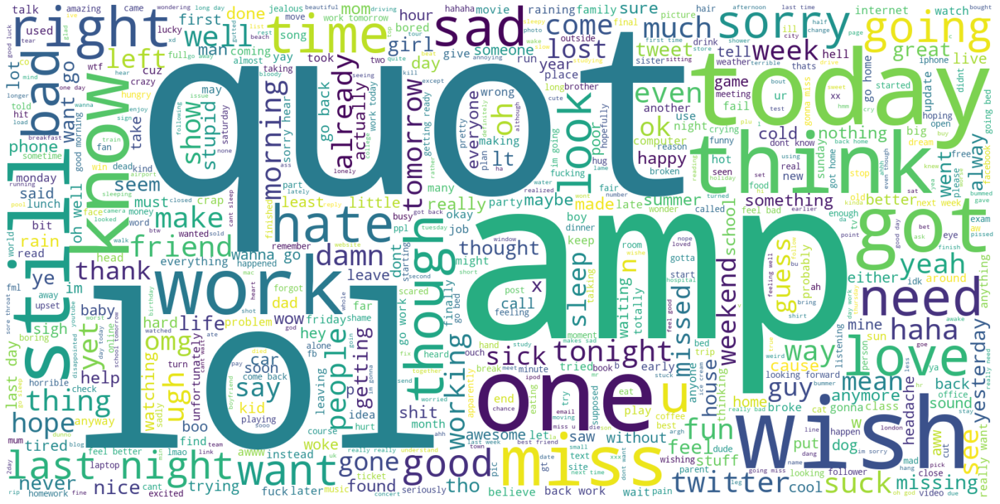

In [30]:
from wordcloud import WordCloud

plt.figure(figsize = (25, 25))
plt.axis('off')
wordcloud_fig = WordCloud(max_words = 2000 , width = 1600 , height = 800, background_color ='white', min_font_size = 10).generate(" ".join(df[df.label == 'Negative'].tweet))
plt.imshow(wordcloud_fig, interpolation = 'bilinear')

### Training Data and Test Data Splitting

In [31]:
from sklearn.model_selection import train_test_split

train_data, test_data = train_test_split(df, test_size=0.2, random_state=7)
print('Training Data', len(train_data), 'Test Data', len(test_data))

train_data.head(10)

Training Data 1273862 Test Data 318466


,label,tweet
927561,Positive,thank
810082,Positive,shakin money tree headed back car business
1153331,Positive,tasmania okay chat ya later
988182,Positive,yeah 100 tab storm towelled raiders awesome
543405,Negative,happy mari asleep gotta start laundry b4 wakes...
22855,Negative,wanting go city raining gotta homework 2
483675,Negative,sitting home bored x
667231,Negative,miss amy cards
1370823,Positive,dinner hubby two us 10 coupo
94439,Negative,know prob running around


In [32]:
test_data.head(10)

,label,tweet
1414233,Positive,nice job thanks
181653,Negative,way wanna shower n get pretty
788422,Negative,woke early think anyone completely bored
76646,Negative,lucky u scheduled today happy camper lol
972366,Positive,way cute curt hope school raised tons money lo...
797869,Negative,stupid braces making lips dry
1129919,Positive,good miss
1036078,Positive,past days sucked hopefully weekend happier
550532,Negative,marcus doubt megan fox good 2 years might get ...
1365388,Positive,going school contempt fash exams going conquer...


### Tokenization

In [33]:
from keras.preprocessing.text import Tokenizer

tokenizer = Tokenizer()
tokenizer.fit_on_texts(train_data.tweet)
word_index = tokenizer.word_index
vocab_size = len(tokenizer.word_index) + 1
print("Vocabulary Size :", vocab_size)

Using TensorFlow backend.


Vocabulary Size : 290458


In [34]:
from keras.preprocessing.sequence import pad_sequences

X_train = pad_sequences(tokenizer.texts_to_sequences(train_data.tweet), maxlen = 30)
X_test = pad_sequences(tokenizer.texts_to_sequences(test_data.tweet), maxlen = 30)

print("X_train, X_test", X_train.shape, X_test.shape)

labels = train_data.label.unique().tolist()

X_train, X_test (1273862, 30) (318466, 30)


In [35]:
encoder = LabelEncoder()
encoder.fit(train_data.label.to_list())

y_train = encoder.transform(train_data.label.to_list())
y_test = encoder.transform(test_data.label.to_list())

y_train = y_train.reshape(-1,1)
y_test = y_test.reshape(-1,1)

print("y_train shape:", y_train.shape)
print("y_test shape:", y_test.shape)

y_train shape: (1273862, 1)
y_test shape: (318466, 1)


### GLOVE Embedding

In [36]:
MODELS_PATH = '../models'
EMBEDDING_DIMENSION = 300

In [37]:
import tensorflow as tf

BATCH_SIZE = 1024
EPOCHS = 10
LR = 1e-3

embeddings_index = {}

glove_file = open('../glove/glove.6B.300d.txt', encoding='utf8')
for line in glove_file:
    values = line.split()
    word = value = values[0]
    coefficients = np.asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefficients
glove_file.close()

print('%s word vectors.' % len(embeddings_index))


embedding_matrix = np.zeros((vocab_size, EMBEDDING_DIMENSION))
for word, i in word_index.items():
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        embedding_matrix[i] = embedding_vector
        
embedding_layer = tf.keras.layers.Embedding(vocab_size, EMBEDDING_DIMENSION, weights=[embedding_matrix], input_length=30, trainable=False)

400000 word vectors.


## Feature Extraction

### Bag of Words

In [38]:
from sklearn.feature_extraction.text import CountVectorizer

K = 20000
shuffled_df = df.sample(frac=1).reset_index(drop=True)
first_K_tweets = shuffled_df['tweet'].head(K)

vectorizer = CountVectorizer(stop_words='english')
vectorizer.fit(first_K_tweets)

# Dictionary
vectorizer.get_feature_names()

['00',
 '000',
 '000th',
 '002',
 '00am',
 '00hrs',
 '00pm',
 '02',
 '021',
 '0238',
 '03',
 '04',
 '0400',
 '06',
 '06am',
 '08',
 '0833111052',
 '09',
 '0o',
 '10',
 '100',
 '1000',
 '100000000000000000000000000000000000000000000000000000000000',
 '1000s',
 '100m',
 '100mil',
 '100s',
 '100th',
 '101',
 '102',
 '103',
 '1030',
 '1045chumfm',
 '1050',
 '105f',
 '106',
 '107',
 '1080',
 '10801',
 '10am',
 '10h40',
 '10k',
 '10lbs',
 '10mile',
 '10min',
 '10mph',
 '10o',
 '10pm',
 '10pp',
 '10th',
 '10yr',
 '10yrs',
 '11',
 '113',
 '114',
 '1145',
 '11am',
 '11more',
 '11pm',
 '11th',
 '11yrs',
 '12',
 '120',
 '1200hd',
 '125',
 '1255',
 '125lbs',
 '126',
 '128',
 '128x64',
 '12am',
 '12c',
 '12hrs',
 '12ish',
 '12k',
 '12pm',
 '12stone',
 '12th',
 '12v',
 '13',
 '130',
 '134',
 '135',
 '1369',
 '13stores',
 '13th',
 '14',
 '140',
 '140conf',
 '144',
 '149',
 '14th',
 '14x',
 '15',
 '150',
 '150k',
 '151',
 '1554',
 '15am',
 '15m',
 '15min',
 '15mm',
 '15th',
 '16',
 '160',
 '1600',
 '1

In [39]:
# Transform each tweets in vector space
vector = vectorizer.transform(first_K_tweets)
vector_spaces = vector.toarray()

vector_spaces

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

In [40]:
for i, v in zip(first_K_tweets, vector_spaces):
    print(i)
    print(v)

theglobalstudio jamesdeleon buzzedition bauart bodyartexpo mary4990 howard74 cc cassin brightondoll hi
[0 0 0 ... 0 0 0]
next door think back take stuff
[0 0 0 ... 0 0 0]
bb10 kitchen awful
[0 0 0 ... 0 0 0]
yeah panic reallyyyy nice
[0 0 0 ... 0 0 0]
stepped fresh tha shower
[0 0 0 ... 0 0 0]
time sleep say goodbye tooth tomorrow makes sad
[0 0 0 ... 0 0 0]
approve
[0 0 0 ... 0 0 0]
19 2ntsu mfwgs cutest song ever
[0 0 0 ... 0 0 0]
status update twitter ice timestamp mon jun 15 10 49 22 cest 2009
[0 0 0 ... 0 0 0]
back runnin new blackberry
[0 0 0 ... 0 0 0]
check thejenproject go seattle photo taken
[0 0 0 ... 0 0 0]
mostly harmless spammers suspended accounts nasties fixed though
[0 0 0 ... 0 0 0]
fed staff meetings
[0 0 0 ... 0 0 0]
prophecy came true paterno hiked price jeremiah weed 9 99 19 99
[0 0 0 ... 0 0 0]
excuse twitter addicts like p let try abt 5 mins clear 27 points
[0 0 0 ... 0 0 0]
jst realised wwdc happening away west highland way next week hv watch keynote get back
[

butt hurts
[0 0 0 ... 0 0 0]
kaotic oh yeah want
[0 0 0 ... 0 0 0]
drivin work gross day
[0 0 0 ... 0 0 0]
must say posts always make smile
[0 0 0 ... 0 0 0]
playing shit especially dating lady friends shes fuckin pissy
[0 0 0 ... 0 0 0]
khushee work today still feel like crap bed sleep bloody birds outside would shut
[0 0 0 ... 0 0 0]
great high def video led zepagain cover band zep set covering immigrant song recorded
[0 0 0 ... 0 0 0]
feel ya still dodging trees across terokar
[0 0 0 ... 0 0 0]
still waiting apple finish fixing macbook pro 5 7 days ass squarespace make feel better iphone 3gs
[0 0 0 ... 0 0 0]
another long boring day sucks
[0 0 0 ... 0 0 0]
work get 13 00hrs sun shining feeling great going town later days go vacation
[0 0 0 ... 0 0 0]
aww join need study
[0 0 0 ... 0 0 0]
nice early 5 30 tanky love morning
[0 0 0 ... 0 0 0]
sad dave moving west coast fall
[0 0 0 ... 0 0 0]
soccer game morningg hopefully dont injure already
[0 0 0 ... 0 0 0]
following four day week
[0

[0 0 0 ... 0 0 0]
funny neighbors opinion except empty backyard home made drunk keyboard guitar singing
[0 0 0 ... 0 0 0]
good stretch sure sore eh
[0 0 0 ... 0 0 0]
corcovado fletcherday
[0 0 0 ... 0 0 0]
mom took last couple bucks gamble lol
[0 0 0 ... 0 0 0]
download movie quot sound music quot cool movie
[0 0 0 ... 0 0 0]
awww yay lt 3 ding ding ding licks love hahahaha
[0 0 0 ... 0 0 0]
saddest moment life
[0 0 0 ... 0 0 0]
wine look fabulous ladies
[0 0 0 ... 0 0 0]
tummy ache
[0 0 0 ... 0 0 0]
hehehe wanna see fuck hubby like sissy friends bust laughing say really sexy manly lol
[0 0 0 ... 0 0 0]
sorry mean shout
[0 0 0 ... 0 0 0]
weather kinda sucky today hope clears enjoy summer
[0 0 0 ... 0 0 0]
today shall great paramore doubt
[0 0 0 ... 0 0 0]
hope
[0 0 0 ... 0 0 0]
yeh much btr feel like shit cldnt come got txt tho lol xxxx
[0 0 0 ... 0 0 0]
schools day one sleep till birthday im getting old
[0 0 0 ... 0 0 0]
home ys connection issues d5027
[0 0 0 ... 0 0 0]
thank much mrt

nice breakfast laws time cleaning laundry etc
[0 0 0 ... 0 0 0]
alright dude peace great one ttyl
[0 0 0 ... 0 0 0]
looking forward picnic park
[0 0 0 ... 0 0 0]
miss paris
[0 0 0 ... 0 0 0]
swear use everyday
[0 0 0 ... 0 0 0]
congratulations looking forward new stuff
[0 0 0 ... 0 0 0]
maybe
[0 0 0 ... 0 0 0]
like quot freefalling quot tom petty nice song
[0 0 0 ... 0 0 0]
success knowing stop play like quote
[0 0 0 ... 0 0 0]
loving makes happy every day
[0 0 0 ... 0 0 0]
english exam tomorrow hate writing essays mine likely macbeth
[0 0 0 ... 0 0 0]
never heard sorry
[0 0 0 ... 0 0 0]
ouch headache
[0 0 0 ... 0 0 0]
mojitos menu evening wish could join us though
[0 0 0 ... 0 0 0]
germany loved twice times braunschweig
[0 0 0 ... 0 0 0]
yayyy prices went
[0 0 0 ... 0 0 0]
think idea blog number four see comes
[0 0 0 ... 0 0 0]
statement written read edit tomorrow needed
[0 0 0 ... 0 0 0]
writing concept software demo video fun inventing characters
[0 0 0 ... 0 0 0]
cant go cos weathe

nommed food shower whatnot pendulum still blaring
[0 0 0 ... 0 0 0]
mean wrote
[0 0 0 ... 0 0 0]
forgot going camping
[0 0 0 ... 0 0 0]
aww bad didnt go coz im clubbin gave seeson amp wife pass coz bday anniv im sure u fun
[0 0 0 ... 0 0 0]
sunglasses back drawer
[0 0 0 ... 0 0 0]
twitter profile worth 249 oh yaa karol beating
[0 0 0 ... 0 0 0]
hi girlie
[0 0 0 ... 0 0 0]
new layout hope everyone likes
[0 0 0 ... 0 0 0]
aaahhh family crap
[0 0 0 ... 0 0 0]
oh shit morgan got caught sneaking hope grounded feel bad
[0 0 0 ... 0 0 0]
seen couple friends damn hate going shows
[0 0 0 ... 0 0 0]
mom rocks
[0 0 0 ... 0 0 0]
awhh lol ahh lovely lmao revolting lmao
[0 0 0 ... 0 0 0]
lol positively awesome thank
[0 0 0 ... 0 0 0]
caught shark
[0 0 0 ... 0 0 0]
got belly ache
[0 0 0 ... 0 0 0]
bugger appengine front surprised tho thought could upload wars lucene index dir problem
[0 0 0 ... 0 0 0]
nugo miss
[0 0 0 ... 0 0 0]
went swimming today project course
[0 0 0 ... 0 0 0]
thanks sharing phot

[0 0 0 ... 0 0 0]
alright things need today ya fun
[0 0 0 ... 0 0 0]
bakemeupla wish could take credit post retweeted halsparks
[0 0 0 ... 0 0 0]
come illinois meaning springfield cause close live
[0 0 0 ... 0 0 0]
must one loves cupcakes good though
[0 0 0 ... 0 0 0]
bored think gonna read 2 41 cares friday lt 3
[0 0 0 ... 0 0 0]
crashing sleep 2 days starting tomorrow life good
[0 0 0 ... 0 0 0]
wanna hear new record come houston
[0 0 0 ... 0 0 0]
reliving conor oberst show memories miss
[0 0 0 ... 0 0 0]
want move somewhere far far away amp nvr cme back
[0 0 0 ... 0 0 0]
bawling get bitten sam
[0 0 0 ... 0 0 0]
happier bird french fry
[0 0 0 ... 0 0 0]
goodnight
[0 0 0 ... 0 0 0]
ru da real 1 u r yeah totally 2 get used 2 seeing da comic dancing seriously love 2 watch really mpressed
[0 0 0 ... 0 0 0]
ok shall stay
[0 0 0 ... 0 0 0]
casely justin timberlakes voices mix well
[0 0 0 ... 0 0 0]
yea deleted
[0 0 0 ... 0 0 0]
one week hell like treatments
[0 0 0 ... 0 0 0]
nice cool got 

[0 0 0 ... 0 0 0]
hope would proud nice meet another viola returned follow
[0 0 0 ... 0 0 0]
im happy back quot tweets quot better ever lt 3
[0 0 0 ... 0 0 0]
yeah seems way avoid
[0 0 0 ... 0 0 0]
awwww wanted ride
[0 0 0 ... 0 0 0]
really love home
[0 0 0 ... 0 0 0]
rocky says hi
[0 0 0 ... 0 0 0]
sleeping awake 4 hours yesss
[0 0 0 ... 0 0 0]
got rid mine tonight sad
[0 0 0 ... 0 0 0]
forgot xbox live would today
[0 0 0 ... 0 0 0]
fence finally complete home alone days
[0 0 0 ... 0 0 0]
watching new season like first ep
[0 0 0 ... 0 0 0]
think im 2 young place
[0 0 0 ... 0 0 0]
nominate peggyrossmanith 4 diplomacy czar clinton would cause belittle enemies submission obamamakemeaczar
[0 0 0 ... 0 0 0]
whimper frowny face
[0 0 0 ... 0 0 0]
sadly hav another week tis fun
[0 0 0 ... 0 0 0]
got health human development exam
[0 0 0 ... 0 0 0]
listening music need update ipod soon suggestions
[0 0 0 ... 0 0 0]
yes
[0 0 0 ... 0 0 0]
jax quot beach quot
[0 0 0 ... 0 0 0]
r u paid say nice th

[0 0 0 ... 0 0 0]
added bands confirmed far site good varied stuff
[0 0 0 ... 0 0 0]
amazing weird guy god needs complete patient amp encouraged
[0 0 0 ... 0 0 0]
haaaaaa love think gonna watch movie today
[0 0 0 ... 0 0 0]
thats comfortable done 6 weeks quad bypass finished badly constipated believe lol
[0 0 0 ... 0 0 0]
baru punya twitter yah follow gue dong gue udah follow km
[0 0 0 ... 0 0 0]
need new friend life cuz im real bored gonna continue bored peeps r gone man life sad well sumtimes
[0 0 0 ... 0 0 0]
seem black tops wtf
[0 0 0 ... 0 0 0]
bed good night people interwebs
[0 0 0 ... 0 0 0]
home alone
[0 0 0 ... 0 0 0]
ah got shower another day school p
[0 0 0 ... 0 0 0]
digg reddit rss feeds netvibes homepage click headline takes comments page webpage
[0 0 0 ... 0 0 0]
quot quot moodle courses get able count number courses two hands happy man
[0 0 0 ... 0 0 0]
oooh thanks link shizu looks really interesting
[0 0 0 ... 0 0 0]
2 online work exams taken phew 3 left go worst 3
[0 

still talking regina aim
[0 0 0 ... 0 0 0]
singing words heart strumming strings soul song last forever
[0 0 0 ... 0 0 0]
jonathanrknight sex without love empty experience empty experiences go one best woody allen
[0 0 0 ... 0 0 0]
uk still fairly cool mo think may blockage tummy finally asleep tho gud
[0 0 0 ... 0 0 0]
great
[0 0 0 ... 0 0 0]
cant tie popping balloon
[0 0 0 ... 0 0 0]
oh mit students unfortunately penchant suicide hope sheet sighting something else
[0 0 0 ... 0 0 0]
wanna play guitar suck much fun
[0 0 0 ... 0 0 0]
ya suppose wish cud hv thm bk
[0 0 0 ... 0 0 0]
reading quot secret quot moment really get copy hope well
[0 0 0 ... 0 0 0]
time clean space
[0 0 0 ... 0 0 0]
still studying got 2 important exams next week
[0 0 0 ... 0 0 0]
meant chiru focus process build party given assembly seats amp think long term get power
[0 0 0 ... 0 0 0]
mouf hurts
[0 0 0 ... 0 0 0]
still airport waiting flight ny wait go home miss cat kasper
[0 0 0 ... 0 0 0]
fabshe feeling well ou

[0 0 0 ... 0 0 0]
sarah think looks like something horror movie creepy im emailing right
[0 0 0 ... 0 0 0]
bagel breaks megwong today
[0 0 0 ... 0 0 0]
going able make tomorrow much packing preparing bored help us move
[0 0 0 ... 0 0 0]
myspace watching mtv want people talk meee
[0 0 0 ... 0 0 0]
ahhh cool wrost part might go soon x
[0 0 0 ... 0 0 0]
getting dressed much today enough time
[0 0 0 ... 0 0 0]
first ones tell happy birthday actual birthday jessie amp shoolay love guys
[0 0 0 ... 0 0 0]
leighton meester shoes point hair
[0 0 0 ... 0 0 0]
good dinner going bed cant meet friends like ones meet second grade smile twitters good night
[0 0 0 ... 0 0 0]
flickr uploadr crashes must try juploadr plain silly
[0 0 0 ... 0 0 0]
bad thanks nice go work look emails
[0 0 0 ... 0 0 0]
99 sure saw steve jobs today vasona park wonder saw ipod ran
[0 0 0 ... 0 0 0]
well didnt mean way
[0 0 0 ... 0 0 0]
yeyyyy able load pic
[0 0 0 ... 0 0 0]
get onto talking much anymore
[0 0 0 ... 0 0 0]
soo

agree sad
[0 0 0 ... 0 0 0]
knee swollen
[0 0 0 ... 0 0 0]
game tomorrow sleep tonight
[0 0 0 ... 0 0 0]
wish little bit taller
[0 0 0 ... 0 0 0]
please say tour cancelled looking forward seeing guys backstage
[0 0 0 ... 0 0 0]
yay get go vacation w corey
[0 0 0 ... 0 0 0]
verdict still one lol
[0 0 0 ... 0 0 0]
yes would pay fly childfree section
[0 0 0 ... 0 0 0]
sure course im fay cahill one end month roses
[0 0 0 ... 0 0 0]
shares rare article bash bing wave time
[0 0 0 ... 0 0 0]
pass looks like earplugs win
[0 0 0 ... 0 0 0]
yeah miss studio60 matty twas brilliant ust english history
[0 0 0 ... 0 0 0]
sad going miss dream team party didnt rsvp time
[0 0 0 ... 0 0 0]
good morning slowly feel like getting better hope today continues healing trend
[0 0 0 ... 0 0 0]
sorry hear
[0 0 0 ... 0 0 0]
mmm gimics r really annoying always catch
[0 0 0 ... 0 0 0]
get scared cannot stop thinking weight
[0 0 0 ... 0 0 0]
miss nicksnider need good tooting night
[0 0 0 ... 0 0 0]
twice two mins
[0

oh hope ok awful
[0 0 0 ... 0 0 0]
ahhh tummy still feel right
[0 0 0 ... 0 0 0]
meant say pic showing anymore
[0 0 0 ... 0 0 0]
wow sounds like left got really exciting definitely count quot lots hangovers quot though ow
[0 0 0 ... 0 0 0]
could keep one thing entire universe would family best friend love via katielouisepack
[0 0 0 ... 0 0 0]
unfortunately manage get preferred white magnum really worth calories
[0 0 0 ... 0 0 0]
waiting dentist lost filling dread
[0 0 0 ... 0 0 0]
thinks doggy prego
[0 0 0 ... 0 0 0]
wish knew could text phone could tweet got town part
[0 0 0 ... 0 0 0]
salaam good morning
[0 0 0 ... 0 0 0]
sat outside mcdonalds waiting dale mum early
[0 0 0 ... 0 0 0]
shut didnt know milo movie would watch scary
[0 0 0 ... 0 0 0]
means phone number whong09 congrats grades smartypants
[0 0 0 ... 0 0 0]
money
[0 0 0 ... 0 0 0]
jus luv man bike get amen
[0 0 0 ... 0 0 0]
hates fathers day
[0 0 0 ... 0 0 0]
got stallion magazine hands looks really good cant wait hear peop

[0 0 0 ... 0 0 0]
like 2 laugh good time follow simple
[0 0 0 ... 0 0 0]
become addict
[0 0 0 ... 0 0 0]
argh full snot unpleasant
[0 0 0 ... 0 0 0]
sorry isihac72 phone tweeted making thing went along
[0 0 0 ... 0 0 0]
bring back 80s say
[0 0 0 ... 0 0 0]
guys love anymore
[0 0 0 ... 0 0 0]
feel really reallly sick
[0 0 0 ... 0 0 0]
ohh drop 1 53 sulumitsretsambew biz
[0 0 0 ... 0 0 0]
believe paramore playing emergency
[0 0 0 ... 0 0 0]
guys check awesomeness chuck already chuckmemondays
[0 0 0 ... 0 0 0]
hot water actually
[0 0 0 ... 0 0 0]
read poker face
[0 0 0 ... 0 0 0]
cont make video guys see build least release still files traceable
[0 0 0 ... 0 0 0]
ummmm possibly work rave theniishnish yes weird 1989 ocean flick aliens underwater awesome
[0 0 0 ... 0 0 0]
hope tomorrow best day life
[0 0 0 ... 0 0 0]
shove feather duster ass let call kinky besides tail much fun
[0 0 0 ... 0 0 0]
laying bed jaymee life good prom
[0 0 0 ... 0 0 0]
work wonderful
[0 0 0 ... 0 0 0]
afraid histo

long careful matters
[0 0 0 ... 0 0 0]
choose would love see live saw tour sat front screaming girl
[0 0 0 ... 0 0 0]
sadly cubs care score
[0 0 0 ... 0 0 0]
trying remember wht real name apple juice wine drinker slappy parachute tweety grumpy lol hate nicknames
[0 0 0 ... 0 0 0]
hope someone spring weather snowing tc right
[0 0 0 ... 0 0 0]
awe looked tvguide amp says epesode paula kimmel run
[0 0 0 ... 0 0 0]
half went away
[0 0 0 ... 0 0 0]
mkay neesa p ur girl
[0 0 0 ... 0 0 0]
misssssss baby
[0 0 0 ... 0 0 0]
hmm smiles see lol
[0 0 0 ... 0 0 0]
wats twittererssss hows everyones weekend gone whos online talk followerss im bored
[0 0 0 ... 0 0 0]
going gym work ass ate last night back later
[0 0 0 ... 0 0 0]
end long weekend back work tomorrow
[0 0 0 ... 0 0 0]
mizpee going new york least 3 years letsmakeastartupbycopyinsomeyanks
[0 0 0 ... 0 0 0]
far madison
[0 0 0 ... 0 0 0]
get past 79 flight control
[0 0 0 ... 0 0 0]
ay le geek est officielement une cible marketing
[0 0 0 ... 0

preparing exam tomorrow 4th july month away almost bday
[0 0 0 ... 0 0 0]
doh twice missed
[0 0 0 ... 0 0 0]
interesting see differing accounts mandy always pc accounts robbie monk
[0 0 0 ... 0 0 0]
well oli steak beach world wide drinking life
[0 0 0 ... 0 0 0]
much hot cook nice salad stir fry nice cold beer
[0 0 0 ... 0 0 0]
omggg saw 3 gross eww
[0 0 0 ... 0 0 0]
something wrong honda jazz sale post really really eager sell see three thejavajive com
[0 0 0 ... 0 0 0]
love n quote
[0 0 0 ... 0 0 0]
got god daughter love baby
[0 0 0 ... 0 0 0]
watching icarly
[0 0 0 ... 0 0 0]
damnit jamesbesmith ready go brooklyn cake man happening day ruined sulking
[0 0 0 ... 0 0 0]
watching weird movie bout alcatraz english proj like 1 2 way thru due mon
[0 0 0 ... 0 0 0]
hate driving near meadowhall busy cut 4 times pulled twice one dozy van driver randomly swaps lanes
[0 0 0 ... 0 0 0]
rarely dye red first aaaagggessss hair hates
[0 0 0 ... 0 0 0]
dear twitter friends
[0 0 0 ... 0 0 0]
walls na

[0 0 0 ... 0 0 0]
know isnt fun lol
[0 0 0 ... 0 0 0]
bored head lol school tomoz
[0 0 0 ... 0 0 0]
anytime
[0 0 0 ... 0 0 0]
feet cold socks r room lol
[0 0 0 ... 0 0 0]
oh bo video asking one gf trying show friend found though
[0 0 0 ... 0 0 0]
estherwo way spend convention time sorry flask teri et al would mind haha
[0 0 0 ... 0 0 0]
hahaaaa computer looks like u accent
[0 0 0 ... 0 0 0]
usually takes hour tweeting
[0 0 0 ... 0 0 0]
good pumped
[0 0 0 ... 0 0 0]
waiting pizza go six flags
[0 0 0 ... 0 0 0]
elusive phone calls
[0 0 0 ... 0 0 0]
date daddio
[0 0 0 ... 0 0 0]
came home school research
[0 0 0 ... 0 0 0]
never started take word hard 2 quit
[0 0 0 ... 0 0 0]
whoa library soooo small think compare germany found management related books manila diplarbeit
[0 0 0 ... 0 0 0]
ugh fair never
[0 0 0 ... 0 0 0]
haha cool 1 yr older
[0 0 0 ... 0 0 0]
good night good morning twitteria
[0 0 0 ... 0 0 0]
yeeeeeessss wait bad drink
[0 0 0 ... 0 0 0]
mum dropped favourite disney mug sma

daughter forcing watch hedge play dora memory game said quot love mom quot ok
[0 0 0 ... 0 0 0]
oh noez forgot leaving sadness going miss national sushi day
[0 0 0 ... 0 0 0]
wants clothes show live
[0 0 0 ... 0 0 0]
got many exams coming really annoyed friend keeps telling lies people xxxxx
[0 0 0 ... 0 0 0]
noo ur rents like rush lame man
[0 0 0 ... 0 0 0]
make feel ugly
[0 0 0 ... 0 0 0]
highly recommends join www m2e asia earn money free shareholder dividends even nothing
[0 0 0 ... 0 0 0]
see tweets hope
[0 0 0 ... 0 0 0]
love mom miss life hard without
[0 0 0 ... 0 0 0]
would love job cruise ship
[0 0 0 ... 0 0 0]
going meet joe
[0 0 0 ... 0 0 0]
want go ouuuuuuuuut air free pleaaase
[0 0 0 ... 0 0 0]
youtube video bet longer would love know
[0 0 0 ... 0 0 0]
listened quot kate lullaby quot michala banas kate manfredi thousand times managed cry every time saw kate farewell
[0 0 0 ... 0 0 0]
completely answer correctly get tweet back still satisfied right
[0 0 0 ... 0 0 0]
oh best

[0 0 0 ... 0 0 0]
someone tell become perfect woman burned frying pan
[0 0 0 ... 0 0 0]
woken phone calls dishwasher technician
[0 0 0 ... 0 0 0]
point inspecting ipsec traffic isg2000 verify ipsec see
[0 0 0 ... 0 0 0]
hope ok
[0 0 0 ... 0 0 0]
awww u sweet thanks
[0 0 0 ... 0 0 0]
going house move tomorrow
[0 0 0 ... 0 0 0]
never gotten tweet shout please
[0 0 0 ... 0 0 0]
listening sun come loop amazing song guys
[0 0 0 ... 0 0 0]
got around 9 eps left 24
[0 0 0 ... 0 0 0]
currently scottsdale rd going get sushiiiii near asu yay
[0 0 0 ... 0 0 0]
chillin w th shawna theb newark jerzey boys
[0 0 0 ... 0 0 0]
broke
[0 0 0 ... 0 0 0]
heading visit mother bed broken foot
[0 0 0 ... 0 0 0]
man chill best friends
[0 0 0 ... 0 0 0]
oh yes would awesome love site way already looked back amp
[0 0 0 ... 0 0 0]
find plane heard news morning sad scary
[0 0 0 ... 0 0 0]
going help local hospice soon class need get depth research done
[0 0 0 ... 0 0 0]
got back jrk today hope wonderful party phot

[0 0 0 ... 0 0 0]
aw back work tomorrow
[0 0 0 ... 0 0 0]
love calling jake telling everything ate today assure lot friends
[0 0 0 ... 0 0 0]
olive said would teach nigga always drunk
[0 0 0 ... 0 0 0]
check pic posted da mutha fuckin shiet lol fun come tomorrow fun
[0 0 0 ... 0 0 0]
studio music synth media ethics mid term probably staying get everything done due tomorrow
[0 0 0 ... 0 0 0]
400th update
[0 0 0 ... 0 0 0]
round call meal u eat n mid day lunch like dinner supper better get stange looks
[0 0 0 ... 0 0 0]
tweets disappearing yet thats good sign
[0 0 0 ... 0 0 0]
way back jakarta
[0 0 0 ... 0 0 0]
shes overly abusive hits
[0 0 0 ... 0 0 0]
look like sorry man
[0 0 0 ... 0 0 0]
work ok went shopping home depot deck stuff kind writer block
[0 0 0 ... 0 0 0]
laundry cleaning normal sunday stuff
[0 0 0 ... 0 0 0]
realizing poison ivy takes 12 36 hours show emphases 36 part lot worse case though
[0 0 0 ... 0 0 0]
happy birthday live zoo look like monkey retro video xxx
[0 0 0 ..

[0 0 0 ... 0 0 0]
gut bathroom bc miss fix
[0 0 0 ... 0 0 0]
2 hours get ready
[0 0 0 ... 0 0 0]
looking forward end school despite fact also end job miss kids alot crap
[0 0 0 ... 0 0 0]
ta madre
[0 0 0 ... 0 0 0]
fun maybe next time
[0 0 0 ... 0 0 0]
know makes sad
[0 0 0 ... 0 0 0]
watching f1 build
[0 0 0 ... 0 0 0]
sleep well last night
[0 0 0 ... 0 0 0]
finally bryant title yeah said bryant
[0 0 0 ... 0 0 0]
happen enjoy quarterly podcasts much less demanding attention p
[0 0 0 ... 0 0 0]
hell watford get patrick wolf new album wish luck
[0 0 0 ... 0 0 0]
like rolo chocolate milk chocolate chip cupcake morning
[0 0 0 ... 0 0 0]
ok kitten bed go great day
[0 0 0 ... 0 0 0]
thank ali
[0 0 0 ... 0 0 0]
ff elhafiz cuz true twitter amp always something original say watch ever changing avi tho
[0 0 0 ... 0 0 0]
watering water poking stick
[0 0 0 ... 0 0 0]
looking something new
[0 0 0 ... 0 0 0]
want invite spymaster please
[0 0 0 ... 0 0 0]
billie jean baby aloha god bless hiya bro
[0

[0 0 0 ... 0 0 0]
slightly get worse nite heads amp draining lily seems better w sleep thks asking
[0 0 0 ... 0 0 0]
going lay since finally acting like summer around
[0 0 0 ... 0 0 0]
love haaaackl lt 333 think
[0 0 0 ... 0 0 0]
amp love make smileeee
[0 0 0 ... 0 0 0]
bump friends danielle brian kids say hello
[0 0 0 ... 0 0 0]
oye also pumping
[0 0 0 ... 0 0 0]
envy wish could forget trueblood season 1 watch first time
[0 0 0 ... 0 0 0]
wanna dnt think mom wud send mee
[0 0 0 ... 0 0 0]
heyy lol danie put u follow friday dent shee meee xx ok
[0 0 0 ... 0 0 0]
long sleep excited weekend shenanigans though
[0 0 0 ... 0 0 0]
hey
[0 0 0 ... 0 0 0]
well horrible dream
[0 0 0 ... 0 0 0]
go whole deal love room filled naughty nice gear
[0 0 0 ... 0 0 0]
hawks play tonight
[0 0 0 ... 0 0 0]
yay see
[0 0 0 ... 0 0 0]
ahhhh warm ist hurting eyes today okay except moustached bitch keeping us gt rrrrrrr
[0 0 0 ... 0 0 0]
going bed hope cry agian tonight
[0 0 0 ... 0 0 0]
feeling well today
[0 0

[0 0 0 ... 0 0 0]
anything fun sexual hahaha george lopez
[0 0 0 ... 0 0 0]
boo lakers good thing left mini trip street lol love taking pictures
[0 0 0 ... 0 0 0]
samjagger hehe well dinosaurs really quite liked
[0 0 0 ... 0 0 0]
watched britains got talent last night even pierce morgan soft spot belly buttons one act asked 2 display
[0 0 0 ... 0 0 0]
les mis amazing think little bit love mister mann
[0 0 0 ... 0 0 0]
waaahh get wahaha wish could see soon tsk tsk impossible
[0 0 0 ... 0 0 0]
serious business planning maduck weekends activities
[0 0 0 ... 0 0 0]
believe im young generation think im gen z something strange
[0 0 0 ... 0 0 0]
fable 2 ending thought auto save means see choices
[0 0 0 ... 0 0 0]
much disappointment oh well get body back bit getting knocked silver lining every cloud
[0 0 0 ... 0 0 0]
kuppa cooking gulti food tonight house
[0 0 0 ... 0 0 0]
wish made yesterday still finals actually need sleep lol
[0 0 0 ... 0 0 0]
read puff8843 poor lady
[0 0 0 ... 0 0 0]
boys

[0 0 0 ... 0 0 0]
nothing grrr
[0 0 0 ... 0 0 0]
freaking hot
[0 0 0 ... 0 0 0]
infuriating ticked substitutes always getting stuff didnt want
[0 0 0 ... 0 0 0]
wwe raw kick ass bad jeff win title back thou
[0 0 0 ... 0 0 0]
still awake packed could leave definitely would alas cant reach cuz feel air
[0 0 0 ... 0 0 0]
update status soon used nilaiku jelek ga bisa sering2 online huhuhuhu nasib
[0 0 0 ... 0 0 0]
masses washing much want wallow proudness looks like gonna go
[0 0 0 ... 0 0 0]
love limewire killed computer
[0 0 0 ... 0 0 0]
yeahp love friends school csi ny best
[0 0 0 ... 0 0 0]
aw love adorable
[0 0 0 ... 0 0 0]
blah dont hate u want call n doesnt
[0 0 0 ... 0 0 0]
sooo excited seeing actual mcfly dougiemcfly dannymcfly tommcfly mcflyharry miss mcflyharry tweets
[0 0 0 ... 0 0 0]
would attending clients browsed see
[0 0 0 ... 0 0 0]
miss lips much x
[0 0 0 ... 0 0 0]
would love
[0 0 0 ... 0 0 0]
goin farhana awhile otw comin house
[0 0 0 ... 0 0 0]
joking know right sweeth

[0 0 0 ... 0 0 0]
today gonna amazing squarespace
[0 0 0 ... 0 0 0]
watching stanley cup
[0 0 0 ... 0 0 0]
feel bloated fat whatever still look good
[0 0 0 ... 0 0 0]
layin bed knowin im gonna get want gnite tweets
[0 0 0 ... 0 0 0]
thas good think might go fun
[0 0 0 ... 0 0 0]
im sad mattpro13 hes still following im going cut hair eat bucket ice cream
[0 0 0 ... 0 0 0]
wooow spent hour tryin get keys locked car car running wasted hella gas jharp late work
[0 0 0 ... 0 0 0]
hey everyone
[0 0 0 ... 0 0 0]
shame dont get uk
[0 0 0 ... 0 0 0]
cleaning th pool ugh lot work lt lt vega gt gt
[0 0 0 ... 0 0 0]
know discontinued yo digi 002 went middle session blown
[0 0 0 ... 0 0 0]
30h 3 concert 15 minutes house needed win ticket radio sucks
[0 0 0 ... 0 0 0]
woohoo scored massive 94 1st exam thats study much
[0 0 0 ... 0 0 0]
going home dishes lame sibling bonding end argument pretty good
[0 0 0 ... 0 0 0]
also computer ready week imma windows overdose
[0 0 0 ... 0 0 0]
tired omg videos ar

[0 0 0 ... 0 0 0]
board b happy tomorrow
[0 0 0 ... 0 0 0]
amazing night tommys fun girls guy goodnite
[0 0 0 ... 0 0 0]
joshing ya good day cheers great one
[0 0 0 ... 0 0 0]
video better words
[0 0 0 ... 0 0 0]
got back shipping bunch new website exclusive toy still got available
[0 0 0 ... 0 0 0]
something get say everyday
[0 0 0 ... 0 0 0]
think tore something deffs bruised back going painful sleep
[0 0 0 ... 0 0 0]
trying calm forget happened
[0 0 0 ... 0 0 0]
food house
[0 0 0 ... 0 0 0]
nicky tick migrane cool 10yr old
[0 0 0 ... 0 0 0]
u looking sweetheart btw nice profile picture jb love
[0 0 0 ... 0 0 0]
attacked ants
[0 0 0 ... 0 0 0]
yeah hate
[0 0 0 ... 0 0 0]
oh sucks
[0 0 0 ... 0 0 0]
best wishes li
[0 0 0 ... 0 0 0]
thx bunch sis happened 2 b ok 2 bad couldnt get u free mom
[0 0 0 ... 0 0 0]
like
[0 0 0 ... 0 0 0]
lol night owls maybe hahahaha resist sorry emj
[0 0 0 ... 0 0 0]
quot know hungry lets go outside balcony eat quot
[0 0 0 ... 0 0 0]
talking maddie
[0 0 0 ...

[0 0 0 ... 0 0 0]
water ya
[0 0 0 ... 0 0 0]
hey skylistic miss see look faaaaaaace
[0 0 0 ... 0 0 0]
cuz shitty weather
[0 0 0 ... 0 0 0]
thank maybe tomorrow lol
[0 0 0 ... 0 0 0]
got home hail ground places half inch thick plants happy
[0 0 0 ... 0 0 0]
didnt know pun balik rumah fri night baru tau sigh knw tetiba je tekejut serious
[0 0 0 ... 0 0 0]
posted pics
[0 0 0 ... 0 0 0]
consider going insane way work early conference call first thing
[0 0 0 ... 0 0 0]
rip farrah shame may feather hair tonight honor
[0 0 0 ... 0 0 0]
wife jus left mi casa
[0 0 0 ... 0 0 0]
asdfsa df right maybe borrow like saying
[0 0 0 ... 0 0 0]
gonna go two melbourne shows sometimes real life gets way
[0 0 0 ... 0 0 0]
heeeeeeeeeey random favourite animal need know
[0 0 0 ... 0 0 0]
poolside restrained jumping
[0 0 0 ... 0 0 0]
iphones allot time addictions go
[0 0 0 ... 0 0 0]
flight back home delayed hour
[0 0 0 ... 0 0 0]
best night long time glad went ace young boyfriend know yet
[0 0 0 ... 0 0 0]
la

bout shout us open ecosystem loving android fans
[0 0 0 ... 0 0 0]
sense english teacher past life
[0 0 0 ... 0 0 0]
weather starting turn might hide scooter cover tonight
[0 0 0 ... 0 0 0]
trying
[0 0 0 ... 0 0 0]
soo almost twelve thirty gonna pull nighter finish braids ugh fingers hurt
[0 0 0 ... 0 0 0]
drank water like said feel like made hot chocolate tummy
[0 0 0 ... 0 0 0]
sitting couch watching rain
[0 0 0 ... 0 0 0]
way seattle yay seattle boo matt leaving
[0 0 0 ... 0 0 0]
miss much
[0 0 0 ... 0 0 0]
oooooooh hour behind okay yup
[0 0 0 ... 0 0 0]
really sad u following
[0 0 0 ... 0 0 0]
victoria secret adding tech line finally smiles
[0 0 0 ... 0 0 0]
consequently dlsu closed 14th bad since planning visit 11th oh well better safe
[0 0 0 ... 0 0 0]
could sleep last night
[0 0 0 ... 0 0 0]
beeen tweeting miley cyrus everday since got im little speck dust lmaaaooo
[0 0 0 ... 0 0 0]
punky died surgery much
[0 0 0 ... 0 0 0]
rehearsals
[0 0 0 ... 0 0 0]
goodnight yall hope u got 

grieving 4 fam n community whose 2 kids died playing hide amp seek amp getting stuck n car trunk parents watch ur babies
[0 0 0 ... 0 0 0]
almost done writing new stuff cough ep cough
[0 0 0 ... 0 0 0]
mommy got gummy bears nicole
[0 0 0 ... 0 0 0]
yup absolutely best
[0 0 0 ... 0 0 0]
denver canadian women rock lol
[0 0 0 ... 0 0 0]
hope sun lightens twilight
[0 0 0 ... 0 0 0]
pretty suckey day
[0 0 0 ... 0 0 0]
anyone give bumps yet reason put much weight since kid prevent friends year
[0 0 0 ... 0 0 0]
absolutely seeing film cool seeing drag hell idk seen
[0 0 0 ... 0 0 0]
oh nice linoleum pattern straight line
[0 0 0 ... 0 0 0]
think
[0 0 0 ... 0 0 0]
media writing evaluation
[0 0 0 ... 0 0 0]
bwhahaha sucks look screenshots amp videos sites cares
[0 0 0 ... 0 0 0]
gonna pick guitar start sing quot everyday exactly quot nine inch nails wish thursday pffff
[0 0 0 ... 0 0 0]
thanks
[0 0 0 ... 0 0 0]
crap raining hard maybe stay
[0 0 0 ... 0 0 0]
throat hurts
[0 0 0 ... 0 0 0]
pray je

[0 0 0 ... 0 0 0]
hanging mom
[0 0 0 ... 0 0 0]
feelin lil today
[0 0 0 ... 0 0 0]
phone deleting receiving txts
[0 0 0 ... 0 0 0]
sorry shouldve came round helped
[0 0 0 ... 0 0 0]
think bed watch tv good night people n sorry tweeting dat much today kisses mwaaah lt 3
[0 0 0 ... 0 0 0]
seems popular one
[0 0 0 ... 0 0 0]
congrats engagment hun
[0 0 0 ... 0 0 0]
spotlight comp annoying ppl 11yrs younger
[0 0 0 ... 0 0 0]
love quot thinks quot cos mixes literature cognitive science quite thought provoking
[0 0 0 ... 0 0 0]
one want 999 one sale moment 799 sometimes really wish lived usa
[0 0 0 ... 0 0 0]
stupid
[0 0 0 ... 0 0 0]
iphone chat
[0 0 0 ... 0 0 0]
good friends rare appreciate mine deeply always trust guys
[0 0 0 ... 0 0 0]
would love live highschool grad assembly last 2 days never happy get good sad think
[0 0 0 ... 0 0 0]
hhhooottt sun mad really really mad
[0 0 0 ... 0 0 0]
nice hair love purple
[0 0 0 ... 0 0 0]
still raining im bord cuz gonna anythinoday proberly
[0 0 0 .

[0 0 0 ... 0 0 0]
sad dallas mavericks season time focus 1st place texas rangers pga tour coming dfw next week
[0 0 0 ... 0 0 0]
40 minutes ago
[0 0 0 ... 0 0 0]
bed watching quot first 48 quot sucks sick
[0 0 0 ... 0 0 0]
many hours playing burnout paradise xbox 360 bed time 0400 hours stayed late accident
[0 0 0 ... 0 0 0]
yea custom implementation show final product done
[0 0 0 ... 0 0 0]
oupsy loged sorry bring speed please
[0 0 0 ... 0 0 0]
doudt kool im work bored tonight lol
[0 0 0 ... 0 0 0]
haha dont knowww ill go eua buy
[0 0 0 ... 0 0 0]
try site work
[0 0 0 ... 0 0 0]
awesome ill let u kno im goin great reviews def gonna watch
[0 0 0 ... 0 0 0]
brought avatar makeover
[0 0 0 ... 0 0 0]
gah oh look sporcle google life doomed forever attempting quizzes limited success
[0 0 0 ... 0 0 0]
got peanut butter sandwhich milk
[0 0 0 ... 0 0 0]
really sorry
[0 0 0 ... 0 0 0]
beach awesome haha bbq fail lol everything else win lets agen soon lt 3
[0 0 0 ... 0 0 0]
summer school starts 

new page updated tonight still used quot twittering quot quot tweeting quot whatever fuck call check comic though
[0 0 0 ... 0 0 0]
back school finally today last big test summer holidays soo happy lt 3 studying
[0 0 0 ... 0 0 0]
woohoo thank much u r doll lt 3
[0 0 0 ... 0 0 0]
st regis beijing bloody mary tour life suck us set red snapper
[0 0 0 ... 0 0 0]
back killing
[0 0 0 ... 0 0 0]
acm template soooo slow write
[0 0 0 ... 0 0 0]
likewise already getting bit hairy lt ahem gt like idea inner arm emo
[0 0 0 ... 0 0 0]
stupid modlife keep kicking wow finally hour changing ip address finally got modlife work
[0 0 0 ... 0 0 0]
find person twitter
[0 0 0 ... 0 0 0]
room clean comin along nicely think ill spend evening ere cosy cuddled certain someone wants come cuddle
[0 0 0 ... 0 0 0]
lolz best exams go
[0 0 0 ... 0 0 0]
last day st andrews spend west sands packing
[0 0 0 ... 0 0 0]
sad boyfriend gone back portmouth
[0 0 0 ... 0 0 0]
retweet even thought dallas lol jk
[0 0 0 ... 0 0 0

wish hehe take almario boys airport
[0 0 0 ... 0 0 0]
last least hungry everything closed
[0 0 0 ... 0 0 0]
ok assignment might take blog entries thrash know know
[0 0 0 ... 0 0 0]
next 1 day potter shelf stacker yeys
[0 0 0 ... 0 0 0]
today eval day wish luck sleep wink last night one days
[0 0 0 ... 0 0 0]
got worlds worst sun burn look like strawberry
[0 0 0 ... 0 0 0]
plus get one work
[0 0 0 ... 0 0 0]
ok got money straight yesssss could find check book got money give away
[0 0 0 ... 0 0 0]
k didnt go bac2sleep gunna take shower go2ernthonys amp watch star wars
[0 0 0 ... 0 0 0]
im work w computer speakers whens next show tune
[0 0 0 ... 0 0 0]
favorite music x japan perfume listening music working prohibited boss recentlly
[0 0 0 ... 0 0 0]
studio wedding proof let know uploading
[0 0 0 ... 0 0 0]
woke txt boss saying working rain back bed
[0 0 0 ... 0 0 0]
sorry 2 hear
[0 0 0 ... 0 0 0]
really used safari 4 always closes try google chrome thanksss
[0 0 0 ... 0 0 0]
watching new 

[0 0 0 ... 0 0 0]
bung ini rumahkoki com khusus buat pria ya according halo bung
[0 0 0 ... 0 0 0]
congrats another year living keep
[0 0 0 ... 0 0 0]
hehehe eating cornetto amp watch movie tweet later
[0 0 0 ... 0 0 0]
left barnes n noble son wanted part time time go saying come quot go quot success
[0 0 0 ... 0 0 0]
goodmorning twitter woke weird weather morning
[0 0 0 ... 0 0 0]
month left high school thank god ready summer
[0 0 0 ... 0 0 0]
ruphotography 500px
[0 0 0 ... 0 0 0]
back twitter
[0 0 0 ... 0 0 0]
hate getting early
[0 0 0 ... 0 0 0]
yay got hair cut soon going put national costume called bunad excited
[0 0 0 ... 0 0 0]
shark su r4
[0 0 0 ... 0 0 0]
need fix hottie serbia
[0 0 0 ... 0 0 0]
wear size plus cold ny
[0 0 0 ... 0 0 0]
im done editing quot phipstape quot back 2 crack brew see got trees though
[0 0 0 ... 0 0 0]
hahaha oh shh bored nothing also hippos scarweee
[0 0 0 ... 0 0 0]
thanks boo got look pic yet let know get chance
[0 0 0 ... 0 0 0]
good music good fri

[0 0 0 ... 0 0 0]
sorry hear dad praying
[0 0 0 ... 0 0 0]
vog upsetting eyes hopefully blows next days
[0 0 0 ... 0 0 0]
yaaay hours upp hi gona b mre creful time
[0 0 0 ... 0 0 0]
west midlands raining
[0 0 0 ... 0 0 0]
watching segment sportscenter quot big baby quot beginning kinda made sad makes wanna cheer celtics
[0 0 0 ... 0 0 0]
making tumblr
[0 0 0 ... 0 0 0]
quot rb mamamiaellen thanks doyle thanks propsjim john rock john lee hooker amp jim
[0 0 0 ... 0 0 0]
thought great trading icc weekend shame go betfair though
[0 0 0 ... 0 0 0]
happened oucccccch right
[0 0 0 ... 0 0 0]
duty
[0 0 0 ... 0 0 0]
im better took furniture bikes appliances u name took miss u hopefully ill see u soon xx
[0 0 0 ... 0 0 0]
guys went early
[0 0 0 ... 0 0 0]
yes finally done paper
[0 0 0 ... 0 0 0]
scope phill thank model playboy
[0 0 0 ... 0 0 0]
really wishin cali 1 taco shop san diego yum 2 jay z eminem show la sighh
[0 0 0 ... 0 0 0]
could use almond meal instead bread flour since use either o

[0 0 0 ... 0 0 0]
running late school againnnn
[0 0 0 ... 0 0 0]
ok xd fair enough
[0 0 0 ... 0 0 0]
god damn nu mai zic nimic decat pofta buna drool
[0 0 0 ... 0 0 0]
mtv movie awards soon
[0 0 0 ... 0 0 0]
give em listen get enough radio life
[0 0 0 ... 0 0 0]
22 followers away 400 woohoo thanks everyone
[0 0 0 ... 0 0 0]
oh boy non paying buyer sadddddd
[0 0 0 ... 0 0 0]
church somewhere lunch baptism plainfield baby kara house romeoville text ps nathan trasoras lt 3
[0 0 0 ... 0 0 0]
maths exam tomoz havn even started revise
[0 0 0 ... 0 0 0]
nothing attractive face getting sunburned peeling
[0 0 0 ... 0 0 0]
sad dr tea closed doors prior ever walking inside
[0 0 0 ... 0 0 0]
follow mw
[0 0 0 ... 0 0 0]
see graduate 10 days thought 12th
[0 0 0 ... 0 0 0]
starting new ob tomorrow thanks kimmy
[0 0 0 ... 0 0 0]
rollercoasters fact get sick
[0 0 0 ... 0 0 0]
really getting old tink thing tell us already
[0 0 0 ... 0 0 0]
new mario exactly looking forward pretty much four swords advent

lol love much
[0 0 0 ... 0 0 0]
sad loved guys
[0 0 0 ... 0 0 0]
get job hopefully ill get next time
[0 0 0 ... 0 0 0]
wants coffee ummm yes add hashbrowns grits chocolate pie good go
[0 0 0 ... 0 0 0]
im still upset plans guy bestie fell ugh teaches never rely ppl
[0 0 0 ... 0 0 0]
josie amp pussycat dolls right tbs
[0 0 0 ... 0 0 0]
thank someone needs keep eye know make sure taking medication
[0 0 0 ... 0 0 0]
shout love olive really miss pushing daisy happy hear u glee go olive go kristen
[0 0 0 ... 0 0 0]
hai yes master voting haha
[0 0 0 ... 0 0 0]
forgot aw makes sad
[0 0 0 ... 0 0 0]
sleep last night makaylah feeling good
[0 0 0 ... 0 0 0]
man sure could used advice 1 1 2 ago hmm memory
[0 0 0 ... 0 0 0]
revisionnn
[0 0 0 ... 0 0 0]
fabtastic hot sunny day right posh skirt red shoes
[0 0 0 ... 0 0 0]
still id back yet got kick week write new shit call u tomorrow xo
[0 0 0 ... 0 0 0]
deer turkey maybe moose two
[0 0 0 ... 0 0 0]
perfect work week head ima happy
[0 0 0 ... 0 0 0]

shut laura lmao killed romance
[0 0 0 ... 0 0 0]
got game yes sims3 oh gonna addicted downloading bad go work tomorrow damn well
[0 0 0 ... 0 0 0]
17 stitches happened
[0 0 0 ... 0 0 0]
waiting go vivo shopping
[0 0 0 ... 0 0 0]
really much u lol maybe encouraging words
[0 0 0 ... 0 0 0]
evening tweeps shops muffin break free wifi going ps good time went
[0 0 0 ... 0 0 0]
lol kinda actually
[0 0 0 ... 0 0 0]
sway sway better win next time
[0 0 0 ... 0 0 0]
mr jbrookeiv oliva series g maduro natural last night
[0 0 0 ... 0 0 0]
cant remember hella lost lol eatinq wat ya eatinq
[0 0 0 ... 0 0 0]
lonely cold bed
[0 0 0 ... 0 0 0]
iforum currently peeved pay wireless hotel x happen pubforum
[0 0 0 ... 0 0 0]
dans le school far early math class
[0 0 0 ... 0 0 0]
sucks bakit daw still plan get postpaid line customize number mica
[0 0 0 ... 0 0 0]
thanks quot never take good advice quot want shirt
[0 0 0 ... 0 0 0]
oh understand thanks wait thought perezhilton hated defend
[0 0 0 ... 0 0 0]
h

[0 0 0 ... 0 0 0]
cruising around local flea market grabbing brunch waved goodbye efuliehan
[0 0 0 ... 0 0 0]
shock pelted cards deeply asleep worn ready hang little loves celebrate
[0 0 0 ... 0 0 0]
wanna se mcfly caceta wait tomorrow night
[0 0 0 ... 0 0 0]
good morning everybody yummy woke even breakfast yet
[0 0 0 ... 0 0 0]
got home college really wants see britney
[0 0 0 ... 0 0 0]
morning throat still sore definitely getting sick least waited till interviews rain today isaac field day
[0 0 0 ... 0 0 0]
watch jon kate plus 8 anymore feel like parents getting divorced ps sweet earrings jon barfo
[0 0 0 ... 0 0 0]
experiment failure breast enlargement specialists following
[0 0 0 ... 0 0 0]
feels bit bummed today
[0 0 0 ... 0 0 0]
want ash come sweden also kellan jackson rob kristen peter
[0 0 0 ... 0 0 0]
lol thanks advice rushinq
[0 0 0 ... 0 0 0]
kinda sad
[0 0 0 ... 0 0 0]
lords dogtown could watch movie amp good
[0 0 0 ... 0 0 0]
hope something extra fun today make
[0 0 0 ... 

[0 0 0 ... 0 0 0]
headache
[0 0 0 ... 0 0 0]
trying send dm borked try later today work reading sun bbq
[0 0 0 ... 0 0 0]
want rabbit
[0 0 0 ... 0 0 0]
oli pleeeease tomorrow promise
[0 0 0 ... 0 0 0]
happy mother day strong hard working mothers may god bless family
[0 0 0 ... 0 0 0]
jealousy caused first time 35 years loved someone ladypn quot good use
[0 0 0 ... 0 0 0]
omg actually followers thats amazing hahahhaa sooo happened life today oh yeah movie movie marathon
[0 0 0 ... 0 0 0]
takin pic u fluid close u couldnt get u flash u
[0 0 0 ... 0 0 0]
sorry dude went last night
[0 0 0 ... 0 0 0]
got home arturos get sleep open house 2morro u r lookin condo brookfield ct let know
[0 0 0 ... 0 0 0]
julie ate eucalyptus plant oh im going fail chemistry
[0 0 0 ... 0 0 0]
wish coachella maybe next year
[0 0 0 ... 0 0 0]
auntie hospital intensive care hope okay
[0 0 0 ... 0 0 0]
black chucks kind day
[0 0 0 ... 0 0 0]
yeah sarah bouse lol misss fresno
[0 0 0 ... 0 0 0]
xoxo one love god bles

bol safe room closet stairs also kittie litter room yum get cozy theres bol
[0 0 0 ... 0 0 0]
marylou netwire enjoying love coming greece reminds take picture
[0 0 0 ... 0 0 0]
pegasusangel night
[0 0 0 ... 0 0 0]
emily amp texting jacob
[0 0 0 ... 0 0 0]
25 today old
[0 0 0 ... 0 0 0]
7 bits good enough anyone
[0 0 0 ... 0 0 0]
sorry late reply im going tomoro cant get time ok cause met atl today
[0 0 0 ... 0 0 0]
2 bed 1 hello new followers 2 forget pray amp support 4 freedom iran 3 hope everyone gr8 mon amp 4 nite
[0 0 0 ... 0 0 0]
watching nikita roomie gunna miss
[0 0 0 ... 0 0 0]
shake shuffle awesome along youtube app store logins suba much cause ive got touch 6
[0 0 0 ... 0 0 0]
good morning strike changeover day feel well booooooo
[0 0 0 ... 0 0 0]
miss voice want see love much dd
[0 0 0 ... 0 0 0]
newest one two rescues previous owner beat dum dum 3 months pic
[0 0 0 ... 0 0 0]
wanna go work
[0 0 0 ... 0 0 0]
finished writing quot create squeeze page scratch quot document nee

[0 0 0 ... 0 0 0]
chelsea aguirreeee wish flight crap
[0 0 0 ... 0 0 0]
bad cold kids helping
[0 0 0 ... 0 0 0]
know right mafia followin typical lol followin lil italian mafiosa princess word lol
[0 0 0 ... 0 0 0]
need someone talk
[0 0 0 ... 0 0 0]
everyone peaceful joyous evening kat
[0 0 0 ... 0 0 0]
heyy demi im really big fan pakistan reply plz
[0 0 0 ... 0 0 0]
yes folks follow shell quite bit quot mkting crap quot nice see become real peeps saturday
[0 0 0 ... 0 0 0]
boyfriends flight left without idk see
[0 0 0 ... 0 0 0]
replied comment stupid cpanel let log lose get new account
[0 0 0 ... 0 0 0]
hate roller coaster rides put midst another one let guard
[0 0 0 ... 0 0 0]
trying enjoy new semester amp excited tomorrow evening
[0 0 0 ... 0 0 0]
definitely makemymumcometomtub
[0 0 0 ... 0 0 0]
coming offline bye
[0 0 0 ... 0 0 0]
tweet tweet tweet hello dear oh hope stop raining till floods
[0 0 0 ... 0 0 0]
sweet dreams headed sexy sleep
[0 0 0 ... 0 0 0]
love movie
[0 0 0 ... 

play connection suck much
[0 0 0 ... 0 0 0]
sad go obama
[0 0 0 ... 0 0 0]
3days last exam know stuck know
[0 0 0 ... 0 0 0]
seeing someone far apart harrrrd skype gift curse
[0 0 0 ... 0 0 0]
got 99 lit final almost got car expensive found sis totaled car wonderful day ish
[0 0 0 ... 0 0 0]
microwave lasagna awesome late night
[0 0 0 ... 0 0 0]
found ur page kindness clarasdiary
[0 0 0 ... 0 0 0]
hahahahaha day
[0 0 0 ... 0 0 0]
go itunes sonnetmusic com endoora com sonnet enjoy
[0 0 0 ... 0 0 0]
time study
[0 0 0 ... 0 0 0]
everyone awesome cant help call miracle team haha
[0 0 0 ... 0 0 0]
cant think anything tweet fifteen dollars poorer yay haha
[0 0 0 ... 0 0 0]
know get til 7 monday thursday
[0 0 0 ... 0 0 0]
home six flags band fun day miss everyone already
[0 0 0 ... 0 0 0]
wont let change mine either taking forever change
[0 0 0 ... 0 0 0]
thank influence make meme unfortunately best
[0 0 0 ... 0 0 0]
think becoming snob totally pretended recoginise old school friend bus
[0 0 

long take tell someone got job week still counting
[0 0 0 ... 0 0 0]
last night last thomasville practice til august
[0 0 0 ... 0 0 0]
already afraid blink come
[0 0 0 ... 0 0 0]
day filled cartoons board games books sock puppets dress super heroes fun watch kids
[0 0 0 ... 0 0 0]
look slim dress boobs look big though mixing royalty today one see
[0 0 0 ... 0 0 0]
missing babies friends
[0 0 0 ... 0 0 0]
take plenty bottled water
[0 0 0 ... 0 0 0]
love show hate finales though
[0 0 0 ... 0 0 0]
school starting tomorrow means less internet less twitter less facebook
[0 0 0 ... 0 0 0]
serious think getting sick
[0 0 0 ... 0 0 0]
job hunting still fan economy
[0 0 0 ... 0 0 0]
urgh like 4000 word essay must start need revise fake court assessment tomorrow bad times
[0 0 0 ... 0 0 0]
finally apt lonely empty inflating bed getting ready sleep time
[0 0 0 ... 0 0 0]
oh god found big puncture cat trevor stomach idea got im really worried
[0 0 0 ... 0 0 0]
finished watching quot marley quot
[0

summer go torrential rain lakes today
[0 0 0 ... 0 0 0]
ypipiee managed network connection balcon standing look quite stupid
[0 0 0 ... 0 0 0]
ugh gotta go stupid drill competition dont wanna go early celtics win
[0 0 0 ... 0 0 0]
blacklights take dark photographs long shutterspeeds look cool good morning
[0 0 0 ... 0 0 0]
weekly psp wallpapers blog growing
[0 0 0 ... 0 0 0]
rockin center part like tomorrow tonight bring
[0 0 0 ... 0 0 0]
thanks much great day
[0 0 0 ... 0 0 0]
altoona pa hollidaysburg pa home slinky
[0 0 0 ... 0 0 0]
milia chin skin yuck 4 em man ugly boo
[0 0 0 ... 0 0 0]
aww cutie adorable god bless xoxo
[0 0 0 ... 0 0 0]
blah going tease hair go2 mall sister
[0 0 0 ... 0 0 0]
sorry currently least populated county ca still need anything monday hook
[0 0 0 ... 0 0 0]
dad taken away lappy
[0 0 0 ... 0 0 0]
worry
[0 0 0 ... 0 0 0]
anyone noticed weather impact outlook day
[0 0 0 ... 0 0 0]
paisley want go outside ah sucks problems women though
[0 0 0 ... 0 0 0]
actual

### tf-idf

In [41]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer(stop_words='english')

# Learn vocabulary from tweets 
vectorizer.fit(first_K_tweets)

# Vocabulary
vectorizer.vocabulary_

{'theglobalstudio': 18738,
 'jamesdeleon': 9874,
 'buzzedition': 3149,
 'bauart': 2036,
 'bodyartexpo': 2575,
 'mary4990': 11758,
 'howard74': 9090,
 'cc': 3464,
 'cassin': 3412,
 'brightondoll': 2874,
 'hi': 8778,
 'door': 5681,
 'think': 18790,
 'stuff': 17973,
 'bb10': 2048,
 'kitchen': 10493,
 'awful': 1737,
 'yeah': 21150,
 'panic': 13807,
 'reallyyyy': 15317,
 'nice': 12979,
 'stepped': 17792,
 'fresh': 7417,
 'tha': 18685,
 'shower': 16828,
 'time': 18932,
 'sleep': 17094,
 'say': 16284,
 'goodbye': 7975,
 'tooth': 19126,
 'tomorrow': 19082,
 'makes': 11585,
 'sad': 16130,
 'approve': 1379,
 '19': 122,
 '2ntsu': 266,
 'mfwgs': 12071,
 'cutest': 4801,
 'song': 17338,
 'status': 17751,
 'update': 19870,
 'twitter': 19559,
 'ice': 9270,
 'timestamp': 18942,
 'mon': 12377,
 'jun': 10198,
 '15': 93,
 '10': 19,
 '49': 373,
 '22': 184,
 'cest': 3524,
 '2009': 160,
 'runnin': 16072,
 'new': 12932,
 'blackberry': 2407,
 'check': 3647,
 'thejenproject': 18743,
 'seattle': 16432,
 'photo':

In [42]:
# Transform to document by term matrix
vector_spaces = vectorizer.transform(first_K_tweets)
vector_spaces.toarray()

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [43]:
for i, v in zip(first_K_tweets, vector_spaces):
    print(i)
    print(v)

theglobalstudio jamesdeleon buzzedition bauart bodyartexpo mary4990 howard74 cc cassin brightondoll hi
  (0, 18738)	0.3141221728597093
  (0, 11758)	0.3141221728597093
  (0, 9874)	0.3141221728597093
  (0, 9090)	0.3141221728597093
  (0, 8778)	0.18973789340291308
  (0, 3464)	0.2755809798735732
  (0, 3412)	0.3141221728597093
  (0, 3149)	0.3141221728597093
  (0, 2874)	0.3141221728597093
  (0, 2575)	0.3141221728597093
  (0, 2036)	0.3141221728597093
next door think back take stuff
  (0, 18790)	0.4192770344549151
  (0, 17973)	0.5508152682401717
  (0, 5681)	0.7216711915077391
bb10 kitchen awful
  (0, 10493)	0.5464689064819573
  (0, 2048)	0.6691373564624328
  (0, 1737)	0.5036138723614362
yeah panic reallyyyy nice
  (0, 21150)	0.351874188967716
  (0, 15317)	0.6466682824669777
  (0, 13807)	0.5819792459419708
  (0, 12979)	0.3454053341833857
stepped fresh tha shower
  (0, 18685)	0.5199404731402785
  (0, 17792)	0.5683691755731954
  (0, 16828)	0.4175328169131193
  (0, 7417)	0.4819592632676596
time sle

  (0, 1753)	0.41949109661646794
bored health social x
  (0, 17280)	0.6306553992521651
  (0, 8620)	0.6306553992521651
  (0, 2689)	0.4522693166556677
today craving eggs toast amp actualy bread house open fridge eggs fml
  (0, 19029)	0.1440104936651415
  (0, 19018)	0.2843074486250942
  (0, 13503)	0.244687254709368
  (0, 9076)	0.20489474251516043
  (0, 7433)	0.29506694986971316
  (0, 7209)	0.26391669943671026
  (0, 6111)	0.5785434430493996
  (0, 4598)	0.2892717215246998
  (0, 2819)	0.2843074486250942
  (0, 1151)	0.15793482098856562
  (0, 706)	0.3401400266101442
car engine lite came today anyone hookup car market
  (0, 19029)	0.171885815401914
  (0, 11717)	0.35612781932668636
  (0, 11132)	0.42276760333621954
  (0, 8991)	0.42276760333621954
  (0, 6299)	0.38482801213466644
  (0, 3322)	0.5152024448717861
  (0, 3251)	0.26951287868773777
figuring wanna bored home nothing
  (0, 20350)	0.4262812752556629
  (0, 8942)	0.3539276677718187
  (0, 6996)	0.6978405945770522
  (0, 2689)	0.4539140721682389
k

  (0, 20860)	0.31913087024082665
  (0, 19801)	0.400746681970027
  (0, 15137)	0.3145080145988933
  (0, 7240)	0.2944586662041042
  (0, 6471)	0.38483261886086023
  (0, 3441)	0.400746681970027
  (0, 3440)	0.38483261886086023
  (0, 1831)	0.3084577686022945
forget us little people
  (0, 14044)	0.5088973284783493
  (0, 11138)	0.5299971477016414
  (0, 7288)	0.6783262728921264
listened fuzzy logic made happy discover great unsigned bands um com register
  (0, 19841)	0.3539445355765183
  (0, 19691)	0.2892644430500999
  (0, 15472)	0.3355044217233545
  (0, 11227)	0.3539445355765183
  (0, 11120)	0.31048274635731965
  (0, 8476)	0.18628830813950595
  (0, 8141)	0.17851188327382228
  (0, 7580)	0.3355044217233545
  (0, 5476)	0.3539445355765183
  (0, 4119)	0.23156925307028167
  (0, 1938)	0.31428611841613474
thank retweet appreciate happy monday
  (0, 18698)	0.3575433207054056
  (0, 15721)	0.5939022307449194
  (0, 12378)	0.40183611643230277
  (0, 8476)	0.3297632895490631
  (0, 1370)	0.49922622380194076
to

  (0, 20886)	0.48351657499432543
  (0, 11680)	0.4424872475445008
  (0, 10095)	0.3855677672659799
  (0, 5493)	0.456409609284853
  (0, 3580)	0.462000565870025
music video shoot 16 hours tired finish choice
  (0, 20127)	0.3343627576948582
  (0, 18970)	0.28593669402568717
  (0, 16781)	0.4135082110868905
  (0, 12637)	0.31437413117838126
  (0, 9075)	0.2966616085872044
  (0, 7047)	0.3569681127663495
  (0, 3781)	0.4071930299237151
  (0, 103)	0.3941841081600515
lili eldest clothes
  (0, 11050)	0.6436733289291999
  (0, 6143)	0.5999766300813207
  (0, 3983)	0.47509229522426916
got new car 94 honda accord really really like much nicer previous car poor poor little dodge neon
  (0, 15315)	0.2695870826955304
  (0, 14750)	0.25189601046041443
  (0, 14526)	0.37751156211282616
  (0, 12983)	0.2544995001471347
  (0, 12932)	0.13912512557446996
  (0, 12884)	0.29337567894519456
  (0, 11138)	0.16697639415907933
  (0, 11036)	0.12238071831621752
  (0, 8969)	0.29337567894519456
  (0, 8040)	0.12593783326033486
  (

  (0, 21127)	0.4332538345024993
  (0, 18703)	0.3468981029415166
  (0, 13366)	0.34764047532195436
  (0, 10508)	0.7557108712876794
check motionportrait woow
  (0, 20904)	0.6342545209737459
  (0, 12472)	0.6604829797357095
  (0, 3647)	0.40185001692646766
morning people since nine best night sleep ever though meds deffo work todayy better good ya
  (0, 21088)	0.2785183323609431
  (0, 20912)	0.19485174458109505
  (0, 19032)	0.40018609000956407
  (0, 17094)	0.22949157330774853
  (0, 14044)	0.24629727720818473
  (0, 13020)	0.21534337190713615
  (0, 12446)	0.22321387234426945
  (0, 11929)	0.3909622519466802
  (0, 7972)	0.18195201970711627
  (0, 5121)	0.45068385611951417
  (0, 2268)	0.24234270479958916
  (0, 2245)	0.25880794668188994
web server sorry inconvenience time start shopping new host guess
  (0, 20485)	0.35395734002820317
  (0, 18932)	0.1938691518039977
  (0, 17725)	0.2760531989904411
  (0, 17398)	0.23041790746574398
  (0, 16792)	0.30120014980112103
  (0, 16546)	0.37323939993666444
  (0

  (0, 21196)	1.0
fully packed train work carrying ofc laptop going office site
  (0, 20912)	0.180879607977051
  (0, 19232)	0.3000631538542962
  (0, 16988)	0.293485690035242
  (0, 13737)	0.3557996773568273
  (0, 13352)	0.29747635853825677
  (0, 13340)	0.406091772093433
  (0, 10744)	0.2991833483568267
  (0, 7951)	0.18060834797325054
  (0, 7529)	0.36292771726510725
  (0, 3380)	0.3965704476538054
tonyhawk gave much deserved props
  (0, 19108)	0.5633113242569344
  (0, 14892)	0.5250701168192984
  (0, 7689)	0.39277727467467244
  (0, 5255)	0.5027004444859823
saw guy 6 10 quot least wife 5 6 quot awesome oh finally seeing star trek
  (0, 20711)	0.33462121007587897
  (0, 19298)	0.35071557411412524
  (0, 17710)	0.31917912961092443
  (0, 16456)	0.2951961091172588
  (0, 16283)	0.26624840550051365
  (0, 15120)	0.4210397376926681
  (0, 13366)	0.20557388118798847
  (0, 8313)	0.2882543765174325
  (0, 7027)	0.25218234567424913
  (0, 1728)	0.24155423771590703
  (0, 19)	0.28381843956955144
yay much hackin

  (0, 19559)	0.26243140553758104
  (0, 14222)	0.5398608393765675
  (0, 10865)	0.4236855060592003
  (0, 4119)	0.678358771927184
im watch desperate housewives
  (0, 20412)	0.3728474633670659
  (0, 9377)	0.30068985344811716
  (0, 9083)	0.648083750156206
  (0, 5271)	0.5920792462817476
tripled amp pitched last inning k last batter sun game amp stars practice never much mt airy baseball
  (0, 19345)	0.3289999536096469
  (0, 18099)	0.19549956006060182
  (0, 17721)	0.28433067418567914
  (0, 14646)	0.2517347947991377
  (0, 14299)	0.31593502691101877
  (0, 12552)	0.28433067418567914
  (0, 9555)	0.3289999536096469
  (0, 7640)	0.20262583872817558
  (0, 2024)	0.3289999536096469
  (0, 1992)	0.27714052617320456
  (0, 1151)	0.2933917681872804
  (0, 948)	0.3289999536096469
trouble like play geekbrief podcast mac itunes gt connect360 xbox360 freezing skipping sound sync
  (0, 21038)	0.3307836075437436
  (0, 19364)	0.25460665818012085
  (0, 18330)	0.29019814126184734
  (0, 17416)	0.22920374129776613
  (0

4 people last night polished 3 5 bottles wine amp 46 beers party continues thru today happy birthday husband
  (0, 20759)	0.2638875328427167
  (0, 19029)	0.1484941528527073
  (0, 14486)	0.3652338441318658
  (0, 14044)	0.1916728341418561
  (0, 13878)	0.21618889074176095
  (0, 13020)	0.16758396550285903
  (0, 9211)	0.2811232672598389
  (0, 8476)	0.18459644880483872
  (0, 4344)	0.33245739052003437
  (0, 2720)	0.33245739052003437
  (0, 2353)	0.21509656766324406
  (0, 2151)	0.35073003235594497
  (0, 1151)	0.16285200371004496
  (0, 367)	0.3652338441318658
yaaay
  (0, 21096)	1.0
amp tonight tooo wooo
  (0, 20886)	0.6235387046123069
  (0, 19120)	0.6235387046123069
  (0, 19099)	0.35402954894149335
  (0, 1151)	0.31154782325847763
like idea supposed say though ahhhh wanna beat head wall text 344 3535
  (0, 20350)	0.2167668377572824
  (0, 20326)	0.3218586800995706
  (0, 18668)	0.27638650935862885
  (0, 18175)	0.2809735482742861
  (0, 16284)	0.21908107206685
  (0, 11036)	0.1592879266007597
  (0, 92

  (0, 21251)	0.6046872499422464
  (0, 19171)	0.48768847272109195
  (0, 3295)	0.6296930072124447
going bed goodnight xo p still freeeeeezing
  (0, 21056)	0.49039221235834995
  (0, 7984)	0.4170746761953004
  (0, 7951)	0.264119360773363
  (0, 7391)	0.6371149375068382
  (0, 2134)	0.3314961722330985
hey
  (0, 8761)	1.0
wedges strappys
  (0, 20501)	0.7071067811865476
  (0, 17901)	0.7071067811865476
looks good bsb
  (0, 11278)	0.5204510509418755
  (0, 7972)	0.34514600352452257
  (0, 2971)	0.7810281299828755
well apparently forgot melatonin probably gonna fall asleep sunrise
  (0, 18128)	0.45527671506576545
  (0, 14805)	0.30166982578758034
  (0, 11963)	0.45527671506576545
  (0, 7968)	0.2415977145145729
  (0, 7293)	0.31937804525062874
  (0, 6750)	0.32851198703857976
  (0, 1532)	0.3237207847742596
  (0, 1345)	0.34835969640224795
th one thing ive learned today least company hell
  (0, 19029)	0.22497542464615033
  (0, 18785)	0.309181235382764
  (0, 18683)	0.4478885287082098
  (0, 10862)	0.44788852

  (0, 849)	0.484922881128069
yes absolutely sooner later stay tuned
  (0, 21196)	0.3047528981013945
  (0, 19438)	0.490850755867162
  (0, 17755)	0.35439094928398474
  (0, 17362)	0.5068534107066676
  (0, 10776)	0.33324991948132066
  (0, 605)	0.4155025545646431
love much gorgeous good talented chef come mine ill cook dinner
  (0, 18399)	0.41980458710610324
  (0, 11351)	0.20952964975866692
  (0, 9351)	0.32017449828688654
  (0, 8026)	0.35594606424901154
  (0, 7972)	0.19321008847958854
  (0, 5420)	0.30366112657861644
  (0, 4384)	0.3884762886445449
  (0, 4124)	0.2537952678593179
  (0, 3673)	0.4536364641394648
nobody ever speaks
  (0, 17487)	1.0
oh hell peeling like crazy knew knew damnit shoulders ever get tan
  (0, 18423)	0.30808211210669895
  (0, 16816)	0.36433901773852245
  (0, 14005)	0.37308649253001785
  (0, 13366)	0.18412610700820306
  (0, 11036)	0.16033618170819525
  (0, 10524)	0.5618199471501861
  (0, 8700)	0.26202138596477215
  (0, 4882)	0.34591435399841186
  (0, 4605)	0.263790157089

  (0, 20358)	0.1943350803856694
  (0, 20119)	0.425681881072819
  (0, 17094)	0.41630520752643324
  (0, 13126)	0.3340772844550909
  (0, 12810)	0.425681881072819
  (0, 9495)	0.39678384828780106
  (0, 8700)	0.2786642130938059
  (0, 1714)	0.2825153536718439
awake good morning shower school spring program painting dunno two days
  (0, 17597)	0.37007363537016497
  (0, 16828)	0.32922384896090695
  (0, 16335)	0.25268946920805363
  (0, 14841)	0.3926562809909759
  (0, 13768)	0.3926562809909759
  (0, 12446)	0.2286722632918854
  (0, 7972)	0.1864014082994972
  (0, 5917)	0.35487453968839106
  (0, 5004)	0.26010302549600905
  (0, 1714)	0.3190944562680551
finished watchin crazy fighting movie tite tite gona go bed yo ill tweet sum later sure
  (0, 21226)	0.23889486687574069
  (0, 20417)	0.2415855166879039
  (0, 19489)	0.1841393844014841
  (0, 18986)	0.6314710991502175
  (0, 18185)	0.17302233687385984
  (0, 18080)	0.26596695647152757
  (0, 12502)	0.17946672215130213
  (0, 10776)	0.18525585821582266
  (0,

  (0, 18703)	0.41351100779910743
  (0, 8679)	0.7427453516986466
  (0, 7234)	0.5266288911169045
holy crap llueve sobre mojado con amigdalitis
  (0, 17274)	0.44402372139842594
  (0, 12353)	0.44402372139842594
  (0, 11182)	0.44402372139842594
  (0, 8936)	0.34847205313174834
  (0, 4583)	0.29989826196247993
  (0, 1139)	0.44402372139842594
limit story 140 ch tell annoying www iamsoannoyed com help relieve stress
  (0, 21024)	0.25392270361053504
  (0, 18582)	0.21579088943173053
  (0, 17918)	0.29592160349776286
  (0, 17881)	0.26431029089362434
  (0, 15528)	0.36867546269540646
  (0, 11060)	0.31056208548826564
  (0, 9251)	0.35403498070490363
  (0, 8719)	0.21230190007255798
  (0, 4119)	0.23162842706145498
  (0, 3533)	0.3290069114313115
  (0, 1258)	0.2653274812970402
  (0, 87)	0.31056208548826564
oh cool sounds like something like
  (0, 17422)	0.49723692343236897
  (0, 13366)	0.3713975607667205
  (0, 11036)	0.6468226342983553
  (0, 4396)	0.4432152677778357
name juanita dont tell sub
  (0, 18582)	0

  (0, 2279)	0.49610272895540936
gonna get im shower got back kickboxing im tired leg hurts running
  (0, 18970)	0.26613317896088035
  (0, 16828)	0.32832938192018385
  (0, 16073)	0.3312351204301405
  (0, 10901)	0.378991496259574
  (0, 10413)	0.4469404381147416
  (0, 9377)	0.4272680396138324
  (0, 9208)	0.29484845754848354
  (0, 8040)	0.19765822026007995
  (0, 7968)	0.2443431417656305
whole body aches head hurts throat killing xxxxx
  (0, 21081)	0.4364885207222873
  (0, 18839)	0.35469790324688205
  (0, 10441)	0.3728920667896381
  (0, 9208)	0.3147740545222121
  (0, 8595)	0.30457961522368254
  (0, 2574)	0.3795866251188709
  (0, 663)	0.45681639840968224
work tommorow woot cleaning windows floors
  (0, 20912)	0.22456182482652912
  (0, 20900)	0.43072548833963537
  (0, 20753)	0.4189047750218606
  (0, 19073)	0.4612045883188894
  (0, 7175)	0.49234175368574895
  (0, 3933)	0.36531665070222497
stolen purse new store see tags still
  (0, 18376)	0.5430158582286964
  (0, 17873)	0.389464494582684
  (0,

bet
  (0, 2256)	1.0
good morning last monday high school
  (0, 16335)	0.43215929588925356
  (0, 12446)	0.3910841421422937
  (0, 12378)	0.5064284250712264
  (0, 8792)	0.5497218878744178
  (0, 7972)	0.31879089229931606
go morgan state visit
  (0, 20183)	0.5176690756259827
  (0, 17739)	0.573045755154263
  (0, 12438)	0.6353245553575125
yeah guess anyways master recipe got
  (0, 21150)	0.303131225663993
  (0, 15358)	0.5280655807338455
  (0, 11781)	0.5013612469017498
  (0, 8263)	0.3447250405938214
  (0, 8040)	0.2391425930695134
  (0, 1321)	0.4493000880751883
nightstand lucky lazy
  (0, 13031)	0.7157528034726683
  (0, 11411)	0.47970390201786334
  (0, 10835)	0.5075254581888992
yorkshire visit boys wait joy national express east coast
  (0, 21255)	0.4199713773174932
  (0, 20300)	0.21745403539596705
  (0, 20183)	0.2957359706914233
  (0, 12800)	0.3462731478873244
  (0, 10141)	0.32959565234370786
  (0, 6654)	0.3629506434309409
  (0, 6016)	0.3498520793982483
  (0, 4020)	0.3462731478873244
  (0, 276

twitter useful reminds people forgot ask given day also excellent inspiration
  (0, 19928)	0.3864314792696097
  (0, 19559)	0.21735948688949644
  (0, 15566)	0.36192436188114413
  (0, 14044)	0.23465735416731012
  (0, 9591)	0.3724855128770079
  (0, 7859)	0.3686750449166884
  (0, 7293)	0.3012147118402243
  (0, 6574)	0.35890297392721254
  (0, 4996)	0.17455056377198608
  (0, 1526)	0.3044601041471368
never got ovi stickers worked nokia
  (0, 20913)	0.41922964679914476
  (0, 17818)	0.494458035902702
  (0, 13686)	0.5320722304544806
  (0, 13114)	0.494458035902702
  (0, 8040)	0.2284034725794315
christine party fun keeps waking kinda scratch nose mom friends singing drunk kareoke room
  (0, 20316)	0.2645253241436161
  (0, 16956)	0.2766703084121843
  (0, 16376)	0.3124949627275983
  (0, 15951)	0.23371254092940805
  (0, 13878)	0.2140314047430992
  (0, 13167)	0.281862097707479
  (0, 12361)	0.21809975435389006
  (0, 10460)	0.23468284331600586
  (0, 10335)	0.2694177555980529
  (0, 10275)	0.3615889440528

  (0, 4996)	0.5169874179830178
holding breath open mine
  (0, 13503)	0.48839036308248224
  (0, 8910)	0.6028419504457824
  (0, 2834)	0.6309171387994512
face hurts
  (0, 9208)	0.677881017745448
  (0, 6707)	0.7351716301520318
alaina bday roman numerals tha dude kno wanted outlined black til late
  (0, 20359)	0.2269054874893989
  (0, 18923)	0.24186800419393328
  (0, 18685)	0.3084937752374483
  (0, 15934)	0.32286075955119947
  (0, 13625)	0.3474212814582265
  (0, 13234)	0.3474212814582265
  (0, 10771)	0.22110754996597046
  (0, 10533)	0.2820174709256109
  (0, 5877)	0.24773273408993282
  (0, 2406)	0.2530768932978155
  (0, 2074)	0.2539106574872038
  (0, 968)	0.3617882657719777
leave work think migraine always feel guilty leave call
  (0, 20912)	0.2196986754255719
  (0, 18790)	0.24127742446938552
  (0, 12121)	0.44081662742483846
  (0, 10872)	0.670915338062372
  (0, 8279)	0.4283180716346745
  (0, 6903)	0.2561535401029376
ready david summer kickoff
  (0, 18087)	0.39863684481884
  (0, 15296)	0.3815

  (0, 5568)	0.5856473849154366
  (0, 1609)	0.8105659384292622
im sorry hear grandad going thing years ago lt 3
  (0, 21163)	0.35798795722982074
  (0, 18785)	0.3075409686306333
  (0, 17398)	0.2775016161432351
  (0, 11399)	0.29533359333055575
  (0, 9377)	0.24523145413763853
  (0, 8626)	0.33246204561052317
  (0, 8100)	0.5130449431736199
  (0, 7951)	0.22817551595529145
  (0, 875)	0.35649044743586816
damn nokia e63 backordered
  (0, 13114)	0.5034231049093082
  (0, 5979)	0.5641211162603372
  (0, 4880)	0.3318130645737958
  (0, 1835)	0.5641211162603372
trying patient really think going take long sor bri
  (0, 19388)	0.2980769764959313
  (0, 18790)	0.2316346112613083
  (0, 17385)	0.5080190116308636
  (0, 15315)	0.2241438781985376
  (0, 13925)	0.43904379466122334
  (0, 11260)	0.2721512290390777
  (0, 7951)	0.21060196318379246
  (0, 2853)	0.48784505392769106
dude took carpet used pressure washer luck went 2 hours still pine sol
  (0, 20565)	0.21943311993270903
  (0, 20395)	0.3699358815980543
  (0

  (0, 1151)	0.14135373389568145
baker berating stupid plays made bustout hand missing family
  (0, 17984)	0.2735254081175529
  (0, 14374)	0.385752465660792
  (0, 12248)	0.2633868831977783
  (0, 8427)	0.3033712189719025
  (0, 6768)	0.2626100616575406
  (0, 3116)	0.4322628608155482
  (0, 2227)	0.4322628608155482
  (0, 1896)	0.4150972578142934
love 80 songs lml
  (0, 17342)	0.4535236549746688
  (0, 11351)	0.2768503980301748
  (0, 11192)	0.6584800845439674
  (0, 480)	0.5329860502376406
hey man coming signing tomorrow gig friday gonna sweeeeet band gonna give shirt
  (0, 19082)	0.1931984990576774
  (0, 18274)	0.4091478372076767
  (0, 16914)	0.3408356601411641
  (0, 16742)	0.3033962881018857
  (0, 11621)	0.2252164064631336
  (0, 8761)	0.22381725189284982
  (0, 7968)	0.4169937819317301
  (0, 7810)	0.3258210516013799
  (0, 7429)	0.24784509769768784
  (0, 4143)	0.23805374446030808
  (0, 1934)	0.29681238331062687
way hot outside work garden stuck least another hour
  (0, 20912)	0.261109779570700

  (0, 2932)	0.29313981079002527
hey pia watched quot copycat dolls quot haha great power eb
  (0, 20414)	0.26352730275137093
  (0, 15120)	0.3749947654136131
  (0, 14624)	0.2937702833894976
  (0, 14203)	0.3822058500155699
  (0, 8761)	0.21772519504793986
  (0, 8348)	0.19296744833420867
  (0, 8141)	0.19276547375825034
  (0, 6036)	0.39801128780783684
  (0, 5637)	0.36229335333539814
  (0, 4427)	0.3822058500155699
nice early eats school
  (0, 16335)	0.40195041525881137
  (0, 12979)	0.39228086874394463
  (0, 6034)	0.6961658012930099
  (0, 6000)	0.4471071021587853
waiting clock turn 5 go home
  (0, 20303)	0.4613465201647921
  (0, 19447)	0.5342810678609204
  (0, 8942)	0.34569320233176726
  (0, 3970)	0.61822272581881
feel well
  (0, 6903)	1.0
good trying figure phone receiving txt messages
  (0, 19610)	0.425284433607822
  (0, 19388)	0.3157034433569446
  (0, 15349)	0.5015331820265294
  (0, 14163)	0.3036353008217284
  (0, 12035)	0.4194231410480826
  (0, 7972)	0.2086016175531256
  (0, 6993)	0.39535

interesting see differing accounts mandy always pc accounts robbie monk
  (0, 15866)	0.3496045150911796
  (0, 13973)	0.28551387128205846
  (0, 12396)	0.33572136005403624
  (0, 11637)	0.3496045150911796
  (0, 9643)	0.2506379741301549
  (0, 5379)	0.3496045150911796
  (0, 653)	0.6134196383525032
well oli steak beach world wide drinking life
  (0, 20932)	0.2991930091296238
  (0, 20700)	0.42160825058733514
  (0, 17762)	0.4315551091651901
  (0, 13418)	0.48601119724575514
  (0, 11010)	0.27960590281332376
  (0, 5809)	0.351778382085279
  (0, 2082)	0.32917448145204975
much hot cook nice salad stir fry nice cold beer
  (0, 17836)	0.40953470973986433
  (0, 16166)	0.3660047003181348
  (0, 12979)	0.45071427394887753
  (0, 9059)	0.26142181843533685
  (0, 7486)	0.3701059748197415
  (0, 4384)	0.34248648042239144
  (0, 4066)	0.26142181843533685
  (0, 2150)	0.322831795126485
omggg saw 3 gross eww
  (0, 16283)	0.36527339654435964
  (0, 13432)	0.5714695804341475
  (0, 8210)	0.5006964098029784
  (0, 6552)	0

way home get ready 4 tha club
  (0, 20452)	0.34822876531139435
  (0, 18685)	0.5911087715854868
  (0, 15296)	0.39080234780499357
  (0, 8942)	0.3137578118912507
  (0, 3991)	0.5274056385664815
nope yet lot allow edibles many waiting lists also
  (0, 20303)	0.3065038682791962
  (0, 13148)	0.3681139153310517
  (0, 11328)	0.3019259308726638
  (0, 11129)	0.47298710261806065
  (0, 6068)	0.5074350693317491
  (0, 1046)	0.44517536713688766
introducingemy thank shout outs made day
  (0, 18698)	0.3242244542646663
  (0, 16819)	0.46119927338132954
  (0, 13632)	0.5279926354195065
  (0, 9675)	0.5916530091000638
  (0, 4996)	0.23096369250364143
damn damn wanna go macau someone drag
  (0, 20350)	0.2967311586589621
  (0, 11488)	0.5443300849260088
  (0, 5747)	0.45344759756430436
  (0, 4880)	0.6403441687003284
bet 5 game 2 get cancelled today
  (0, 19029)	0.31012902178065216
  (0, 7640)	0.4697892333015976
  (0, 3277)	0.6074393914222023
  (0, 2256)	0.5604778781289208
two faveys round 2 fa
  (0, 15990)	0.48442

darn 1 chance give tm trial run tonight
  (0, 19317)	0.5094903858787035
  (0, 19099)	0.26882579257858014
  (0, 19005)	0.4829465074504277
  (0, 16068)	0.34019089425326743
  (0, 4947)	0.413576248073629
  (0, 3566)	0.3848892741810354
airport waiting sleep fabulous time
  (0, 20303)	0.4346791974043809
  (0, 18932)	0.3052704609684594
  (0, 17094)	0.35189253812750426
  (0, 6702)	0.5776247753338903
  (0, 945)	0.5102795327412647
photoshoot cancelled totally gonna go outside start punching raindrops face
  (0, 19162)	0.27730208001963297
  (0, 17725)	0.26173744779281977
  (0, 15184)	0.433321643583574
  (0, 14997)	0.433321643583574
  (0, 14183)	0.3944349221635521
  (0, 13633)	0.2685908601826139
  (0, 7968)	0.22081557632561946
  (0, 6707)	0.28897726633042814
  (0, 3277)	0.34507163610491004
lol never knew dragonflies ate know think better wondering
  (0, 20867)	0.4108323561325537
  (0, 18790)	0.24757386283002622
  (0, 11235)	0.2268061961553027
  (0, 10541)	0.23572792098941098
  (0, 10524)	0.3810726

  (0, 3254)	0.610485000834655
going eat asian cooking mom ugh
  (0, 19656)	0.35489605590335216
  (0, 12361)	0.35976695532260167
  (0, 7951)	0.24726559238306747
  (0, 6025)	0.3831995547488266
  (0, 4392)	0.491790754469102
  (0, 1520)	0.5429329693844474
city xkatelynmoshx
  (0, 21052)	0.8202845170246592
  (0, 3879)	0.571955689830621
thanks surrounded boxes feels good
  (0, 18703)	0.2976838958452058
  (0, 18203)	0.6044743902608751
  (0, 7972)	0.2514177328573803
  (0, 6908)	0.4293775302199341
  (0, 2748)	0.5462774659641824
yesssssssss pau hana time folks
  (0, 21204)	0.5179999637537558
  (0, 18932)	0.21973596072208113
  (0, 13943)	0.5179999637537558
  (0, 8425)	0.4974296521713884
  (0, 7233)	0.40942877745514017
okay flu aww
  (0, 13400)	0.548609626310419
  (0, 7188)	0.6358737609574908
  (0, 1749)	0.5428554485729312
warm comfy bed yesss plan
  (0, 21201)	0.5044215788244599
  (0, 20374)	0.4461701665603434
  (0, 14336)	0.4344013968200535
  (0, 4138)	0.5106006756060777
  (0, 2134)	0.3115660921

  (0, 1798)	0.4056757046755916
almost done econ project juss gotta graph happy
  (0, 14853)	0.37646328844613414
  (0, 10217)	0.485191854941783
  (0, 8476)	0.25536647891158964
  (0, 8122)	0.485191854941783
  (0, 8050)	0.29466921385695327
  (0, 6046)	0.485191854941783
awesomest person thw whole wide world ily
  (0, 20932)	0.29777119711697775
  (0, 20700)	0.4196047021853868
  (0, 18876)	0.4837015959601679
  (0, 14091)	0.3262397571023177
  (0, 9372)	0.4011201329881468
  (0, 1733)	0.4837015959601679
ugh horse sight well one mine least neighbors frown stealth riding
  (0, 19656)	0.2602488789766741
  (0, 17767)	0.42002087267516053
  (0, 16902)	0.38372454432960373
  (0, 15797)	0.34831149971878916
  (0, 12875)	0.39813825567072103
  (0, 9040)	0.3903280116004217
  (0, 7471)	0.42002087267516053
finally two remaining original 2005 nin crew jennabunnie stupid camera red eye
  (0, 17984)	0.23885198790830642
  (0, 15548)	0.34359282508125816
  (0, 15404)	0.25701879381498327
  (0, 13563)	0.3005923959631

going run
  (0, 16068)	0.8397697203970984
  (0, 7951)	0.5429427379606244
got blink 182 tix
  (0, 18993)	0.5332705681819135
  (0, 8040)	0.26096211592550433
  (0, 2476)	0.5471057671290644
  (0, 120)	0.5900818203747177
yeh know cant wait till tomorrow night long plus dinner em wont see xx
  (0, 21179)	0.3792823834080063
  (0, 21076)	0.3023938673170181
  (0, 20872)	0.32449819247268613
  (0, 20300)	0.24466847368208375
  (0, 19082)	0.22312781987914884
  (0, 18926)	0.28966966318024207
  (0, 14422)	0.34279303578576475
  (0, 13020)	0.21681617690894703
  (0, 11260)	0.25313987919209807
  (0, 10541)	0.2051445362358795
  (0, 6204)	0.3350618700012594
  (0, 5420)	0.2879230627724441
alright repairman shown hopefully time get home vacation fixed since need use
  (0, 19970)	0.32962559510597134
  (0, 19926)	0.2746636798240635
  (0, 18932)	0.1876641272868399
  (0, 16837)	0.44239463951652913
  (0, 15599)	0.44239463951652913
  (0, 12851)	0.2106127299925724
  (0, 9009)	0.27892888016851436
  (0, 8942)	0.20022

looking forward end school despite fact also end job miss kids alot crap
  (0, 16335)	0.2129249114202287
  (0, 12242)	0.19212831402736788
  (0, 11276)	0.23004193358590244
  (0, 10430)	0.2701811201022328
  (0, 10045)	0.25194739406831684
  (0, 7315)	0.2511207209302875
  (0, 6719)	0.3099910194558137
  (0, 6269)	0.5006218397120684
  (0, 5276)	0.3776335065747507
  (0, 4583)	0.2736336336870955
  (0, 1072)	0.31795340697497115
ta madre
  (0, 18346)	0.6798987952382375
  (0, 11523)	0.7333059581331609
fun maybe next time
  (0, 18932)	0.4887777600709539
  (0, 11851)	0.658432489782841
  (0, 7532)	0.5723311608312008
know makes sad
  (0, 16130)	0.5577605444882998
  (0, 11585)	0.6723673122969184
  (0, 10541)	0.4866470716717951
watching f1 build
  (0, 20418)	0.39861525472758624
  (0, 6685)	0.6485005314949486
  (0, 3028)	0.6485005314949486
sleep well last night
  (0, 17094)	0.7292279248296699
  (0, 13020)	0.6842708773933122
finally bryant title yeah said bryant
  (0, 21150)	0.22398219403462752
  (0, 189

  (0, 113)	0.36814717470044633
definitely becoming good friend mine heard bit things going
  (0, 18788)	0.3965981825822703
  (0, 8627)	0.4438350538087824
  (0, 7972)	0.25738573623930316
  (0, 7951)	0.2752200728493231
  (0, 7436)	0.38273182952487395
  (0, 5132)	0.45725130643135203
  (0, 2369)	0.3849213040346367
take look facebook group come x
  (0, 11273)	0.44405346859039846
  (0, 8215)	0.6013130045866855
  (0, 6708)	0.5319374798120236
  (0, 4124)	0.39784633354977883
last day breck tomorrow strange season
  (0, 19082)	0.30052466835797004
  (0, 17894)	0.5108449163777413
  (0, 16426)	0.42654694090287487
  (0, 4996)	0.2484467241329453
  (0, 2838)	0.6364387854250857
twitter search appears even get failwhale anyone else problems
  (0, 19559)	0.2779608783504371
  (0, 16421)	0.4260501920479313
  (0, 14809)	0.42014974067802796
  (0, 6736)	0.57180729872144
  (0, 1354)	0.4875752172738581
welcome actually swedish fans trying get mcfly us close
  (0, 20544)	0.33084552148132296
  (0, 19388)	0.307886

  (0, 18788)	0.3162773341390712
  (0, 13853)	0.42495940265133175
  (0, 8207)	0.4819255844034557
  (0, 8052)	0.4051001616099567
  (0, 4996)	0.20667675862736057
  (0, 245)	0.5294378732319477
craigslist broken one buying stuff
  (0, 17973)	0.3817795477678064
  (0, 4570)	0.637359225277293
  (0, 3143)	0.5115837180191554
  (0, 2913)	0.4316244829916804
updated blog got comments yet still new tho
  (0, 19871)	0.5011474262316082
  (0, 18809)	0.38851347197615543
  (0, 12932)	0.2907951273833352
  (0, 8040)	0.2632314480515417
  (0, 4153)	0.5125499082580254
  (0, 2503)	0.4258503604154351
good times
  (0, 18940)	0.84704795840048
  (0, 7972)	0.5315164683898128
finally home super fun night morning girlies danii christina
  (0, 18143)	0.31855099892018596
  (0, 13020)	0.21863338342162736
  (0, 12446)	0.22662412919918445
  (0, 8942)	0.21566223379157196
  (0, 7842)	0.43373054167094716
  (0, 7532)	0.23668045188797557
  (0, 7027)	0.26889110574522146
  (0, 4918)	0.47649135669411524
  (0, 3817)	0.457569394610

hey wats everyone ugh im sooo bored right
  (0, 20441)	0.5342166650509256
  (0, 19656)	0.3677981066628509
  (0, 17364)	0.40927930153801545
  (0, 15800)	0.3047762900414766
  (0, 9377)	0.2754096389664938
  (0, 8761)	0.33814490880484466
  (0, 2689)	0.3588126604398261
madden true gift football
  (0, 19371)	0.39180281520161214
  (0, 11513)	0.5856332613794578
  (0, 7807)	0.4895039846740017
  (0, 7269)	0.5137217984030127
troubles paradise philospher
  (0, 19365)	0.5853006468054109
  (0, 14153)	0.6095047058549511
  (0, 13836)	0.5347215783843374
hey dont cry gonna make sad dont cry nuttin espacilly ne nigga lt lt never kry keep ya head
  (0, 21088)	0.20155064606425419
  (0, 16130)	0.1689911124129565
  (0, 13255)	0.33962563937068285
  (0, 13016)	0.3165696595473655
  (0, 12833)	0.289595892319317
  (0, 11580)	0.1724083314948387
  (0, 11399)	0.3644657503696118
  (0, 10616)	0.33962563937068285
  (0, 8761)	0.18578633531359667
  (0, 8595)	0.20207863727325004
  (0, 7968)	0.17306920252676056
  (0, 6434)

  (0, 12550)	0.4566900043911133
  (0, 12363)	0.38860251574972277
  (0, 10744)	0.38746310684431245
  (0, 9653)	0.38634671788262587
  (0, 6708)	0.3841794058216415
  (0, 4291)	0.4398148055723426
vat return hearing word makes want well vomit company return fully understand feel
  (0, 20905)	0.252465691331846
  (0, 20358)	0.16254500693146884
  (0, 20231)	0.299924397116915
  (0, 20024)	0.3560472158308502
  (0, 19743)	0.24906093363072151
  (0, 15717)	0.5628416466964452
  (0, 11585)	0.2135648584269852
  (0, 8629)	0.2814208233482226
  (0, 7529)	0.29660082936607157
  (0, 6903)	0.17235137631586
  (0, 4176)	0.26797236079607445
need read another chapter half take online final want
  (0, 20358)	0.268236216378011
  (0, 15288)	0.3569561045199178
  (0, 13453)	0.3918363045216994
  (0, 12851)	0.27972168570298717
  (0, 8398)	0.37976789671267974
  (0, 7022)	0.40839102404979777
  (0, 3591)	0.5077842817352825
much longer man time flies older get
  (0, 18932)	0.2758000838241122
  (0, 13413)	0.5309738905396642

thanks take run mwahaha
  (0, 18703)	0.3604474971616532
  (0, 16068)	0.5034825137085163
  (0, 12674)	0.7852279670131812
listening nelly furtado avoiding criminology 18 277 words much half summary right far outtt 5 chapters go
  (0, 20908)	0.22623065093029243
  (0, 18085)	0.30924261201493125
  (0, 15800)	0.1524723020304298
  (0, 13640)	0.30924261201493125
  (0, 12882)	0.30924261201493125
  (0, 11123)	0.19263299595074573
  (0, 8398)	0.19987855770030855
  (0, 7567)	0.30924261201493125
  (0, 6789)	0.19263299595074573
  (0, 4648)	0.30924261201493125
  (0, 3592)	0.30924261201493125
  (0, 1704)	0.28824922813396836
  (0, 218)	0.30924261201493125
  (0, 118)	0.2426951595857909
really want watch james giant peach dont
  (0, 20412)	0.30877125127026817
  (0, 20358)	0.2551531272054175
  (0, 15315)	0.24659358413976679
  (0, 13988)	0.5087446247982564
  (0, 9871)	0.4564414076518818
  (0, 7804)	0.470802821287799
  (0, 5662)	0.2998893994700237
k play guitar trying figure strumming pattern hello beautiful

  (0, 18640)	1.0
know joseph arthur big fan rest artists label checking
  (0, 15681)	0.2757260973596967
  (0, 10663)	0.40357312418042846
  (0, 10541)	0.18245258322619742
  (0, 10122)	0.3917320596500636
  (0, 6771)	0.29120445775648524
  (0, 3652)	0.3254872011632969
  (0, 2308)	0.2462846555550202
  (0, 1492)	0.3825474164495762
  (0, 1481)	0.4202621672932032
nooooooooo back
  (0, 13141)	1.0
yes done storage byebye speakers tv 30m ethernet cable next 2 5 months
  (0, 21196)	0.2138969658575529
  (0, 19467)	0.256617763106587
  (0, 17872)	0.35574528531189786
  (0, 17485)	0.35574528531189786
  (0, 12412)	0.2788536821174236
  (0, 6469)	0.3986376975896908
  (0, 3188)	0.3286831862033846
  (0, 3166)	0.36286354847152086
  (0, 288)	0.3986376975896908
know anne judy
  (0, 10541)	0.31437840638472253
  (0, 10168)	0.695384375469503
  (0, 1237)	0.6462250288807232
people hate monday boss day like em
  (0, 14044)	0.34012070271369266
  (0, 12378)	0.39915585703082196
  (0, 11036)	0.25961773027441953
  (0, 85

evening hope well
  (0, 9006)	0.5810034503695792
  (0, 6508)	0.8139010939043169
updated new pictures
  (0, 19871)	0.6896767961472777
  (0, 14220)	0.6034841678490823
  (0, 12932)	0.400190924449227
stomach hurtsss need food get late without waking dad guess go doe sleep night twitpops
  (0, 20316)	0.2914818869039702
  (0, 19550)	0.39843681521739766
  (0, 17855)	0.29408436319458353
  (0, 17094)	0.19483014008866772
  (0, 13020)	0.18281882297948773
  (0, 12851)	0.18968553840116525
  (0, 10771)	0.24350537693913915
  (0, 9209)	0.39843681521739766
  (0, 8263)	0.2367605868399871
  (0, 7253)	0.25258292276355515
  (0, 5608)	0.39843681521739766
  (0, 4848)	0.2564884477273916
jack purcell converse shoes go jcrew
  (0, 16775)	0.3639035203043862
  (0, 15016)	0.49955580629733337
  (0, 9929)	0.49955580629733337
  (0, 9834)	0.38940860831283064
  (0, 4372)	0.46564273479909657
realy realy tiered
  (0, 18903)	0.4472135954999579
  (0, 15323)	0.8944271909999159
tired yawn
  (0, 21125)	0.8450777622803445
  (0

  (0, 20653)	0.4298856476067354
  (0, 18970)	0.23860038339743697
  (0, 11276)	0.24409464616476903
  (0, 8914)	0.40070223602473526
  (0, 7079)	0.3581110424222582
  (0, 7076)	0.34795745345957435
  (0, 5851)	0.3581110424222582
  (0, 4515)	0.40070223602473526
ua gio moi len toi cong ty
  (0, 19634)	0.39386286071621623
  (0, 19613)	0.324746256488347
  (0, 19051)	0.39386286071621623
  (0, 12349)	0.378222161232487
  (0, 10926)	0.378222161232487
  (0, 7832)	0.378222161232487
  (0, 4273)	0.39386286071621623
going store buy beads hiv model
  (0, 17873)	0.36251092184534234
  (0, 12334)	0.45487458692102484
  (0, 8865)	0.5263368731630225
  (0, 7951)	0.21819572938481935
  (0, 3141)	0.3278650639254245
  (0, 2090)	0.47910287120893286
dinner buddakan philly last night edame ravioli divine www buddakan com
  (0, 21024)	0.22831441721533913
  (0, 15261)	0.3314942784163272
  (0, 14150)	0.2826623500351995
  (0, 13020)	0.15210289684561587
  (0, 6056)	0.3314942784163272
  (0, 5540)	0.3183302995129668
  (0, 54

  (0, 21127)	0.251945837665252
  (0, 20452)	0.22075452275096916
  (0, 16432)	0.7595883869165132
  (0, 11814)	0.3797941934582566
  (0, 10877)	0.29307160263984666
  (0, 2623)	0.28404510974706076
miss much
  (0, 12242)	1.0
oooooooh hour behind okay yup
  (0, 21317)	0.4905873895334131
  (0, 13488)	0.65517329208361
  (0, 13400)	0.4022525872737565
  (0, 9073)	0.41020095880273694
really sad u following
  (0, 16130)	0.5308439284078038
  (0, 15315)	0.47070669493103684
  (0, 7243)	0.7047268485162675
victoria secret adding tech line finally smiles
  (0, 20122)	0.4183881156109977
  (0, 18539)	0.4017287312696687
  (0, 17181)	0.4017287312696687
  (0, 16441)	0.3769444280068906
  (0, 11077)	0.3432153421589002
  (0, 7027)	0.26912255833113924
  (0, 732)	0.4121512020594056
consequently dlsu closed 14th bad since planning visit 11th oh well better safe
  (0, 20183)	0.2731476633641131
  (0, 16150)	0.2791586125689789
  (0, 14348)	0.30889573508381785
  (0, 13366)	0.17843814346689088
  (0, 5567)	0.37249030342

  (0, 1708)	0.4275019798149518
day upsets susan boyle looses lebron cavs
  (0, 19891)	0.4282686967108853
  (0, 18209)	0.38542711917385447
  (0, 11307)	0.44597898095683125
  (0, 10883)	0.39125962824022387
  (0, 4996)	0.17409689570830889
  (0, 3457)	0.36422065467376136
  (0, 2758)	0.39125962824022387
get get yoga tomorrow im really excited love yoga much
  (0, 21228)	0.8509715848878701
  (0, 19082)	0.23247736428966032
  (0, 15315)	0.21722214684836036
  (0, 11351)	0.20699492256997362
  (0, 9377)	0.21935461049532384
  (0, 6582)	0.28922799416661554
true detailed design turns coded app word doc soon gets date
  (0, 20905)	0.27692253612032747
  (0, 19454)	0.3006002264601084
  (0, 19371)	0.25090382638685976
  (0, 17361)	0.20955102255766783
  (0, 7781)	0.2591912977545644
  (0, 5587)	0.3220050246636049
  (0, 5292)	0.3640259519672785
  (0, 5258)	0.3161089004552311
  (0, 4961)	0.28959664714668015
  (0, 4044)	0.39053820527582933
  (0, 1343)	0.2939313669525908
coming back shore pilates 12
  (0, 1679

  (0, 4996)	0.19232665701670482
fml go work tomorrow jb half hour away
  (0, 20912)	0.2522005248987609
  (0, 19082)	0.28683704281861
  (0, 9919)	0.47673114991577004
  (0, 9073)	0.3803226881737684
  (0, 8398)	0.3926256082676012
  (0, 7209)	0.4526086180447114
  (0, 1721)	0.35098723662304737
icecream always good fun trip
  (0, 19342)	0.5245994934966647
  (0, 9271)	0.6879198864093204
  (0, 7972)	0.3086006285415317
  (0, 7532)	0.39538241408717484
watched back future movies almost 2015 flying car
  (0, 20414)	0.352900886292956
  (0, 12505)	0.3850972166133392
  (0, 7575)	0.4032792309537256
  (0, 7204)	0.4182965695603803
  (0, 3322)	0.3247646423820273
  (0, 166)	0.5329942467270812
good morning happy tuesday
  (0, 19418)	0.6711334140299514
  (0, 12446)	0.4435289604181849
  (0, 8476)	0.4713279441674803
  (0, 7972)	0.3615411053942867
done graduation im going miss laughgrl bestie
  (0, 12242)	0.28135295523160947
  (0, 10791)	0.5932828721757862
  (0, 9377)	0.26433300477615457
  (0, 8087)	0.45136835

  (0, 2516)	0.3043793678722687
nice cold cider ironing
  (0, 12979)	0.3305304867753966
  (0, 9739)	0.6188195752429728
  (0, 4066)	0.3834264228824583
  (0, 3847)	0.6006630576651841
love summer bbqs sundays
  (0, 18112)	0.5683741088672055
  (0, 18087)	0.39255889624414064
  (0, 11351)	0.2802495124060536
  (0, 2060)	0.6665647726554121
omg got first shall go read nowww
  (0, 16608)	0.48063021662226085
  (0, 15288)	0.39913737512472425
  (0, 13431)	0.37188820864271155
  (0, 13200)	0.630900540747467
  (0, 8040)	0.2708276548014481
suck going twitter love haha messing w jack fun today
  (0, 19559)	0.28001810285849466
  (0, 19029)	0.23420192847313967
  (0, 18032)	0.3851022643105934
  (0, 12040)	0.49118382468814564
  (0, 11351)	0.24218912371808043
  (0, 9834)	0.4490282498941786
  (0, 8348)	0.2792806155845936
  (0, 7951)	0.2388001405667782
  (0, 7532)	0.28612742778731903
really wish bar hear coverage
  (0, 20792)	0.3254655004495134
  (0, 15315)	0.2910826235176967
  (0, 8626)	0.3984968064893394
  (0

  (0, 7285)	0.27292001260770815
pretty sure show beach park since live like 10 mins away
  (0, 18185)	0.2986326972516267
  (0, 14740)	0.31559630380592973
  (0, 13855)	0.38374534953232753
  (0, 12205)	0.41014845016512086
  (0, 11143)	0.32174668054902505
  (0, 11036)	0.21829786982489116
  (0, 2082)	0.35443817565777025
  (0, 1721)	0.314875044865781
  (0, 19)	0.3461035105838676
yes tweeps know change flat except dealer lugnut key
  (0, 21196)	0.24446040352903448
  (0, 19487)	0.3551434446674822
  (0, 11417)	0.45559847950138616
  (0, 10541)	0.1977934869425493
  (0, 10388)	0.3837836478315655
  (0, 7114)	0.339463697162201
  (0, 5034)	0.45559847950138616
  (0, 3572)	0.3119688161617449
think school sucks get 3 day weekend woop woop
  (0, 20899)	0.8427903371898854
  (0, 20522)	0.25690837681448614
  (0, 18790)	0.21900921707516394
  (0, 18044)	0.2772207894652576
  (0, 16335)	0.2524432013242179
  (0, 4996)	0.1875061606760397
alright enough festivities night im goin bed good night tomorrow brighter a

  (0, 5360)	0.2666638390522648
awake ready day
  (0, 15296)	0.5907487186737378
  (0, 4996)	0.4090700993367133
  (0, 1714)	0.6954693416779696
ground beef recall sad truth front us eating meat wrong blame beef company handle truth
  (0, 20998)	0.17829407955100268
  (0, 19385)	0.50650073640573
  (0, 16130)	0.14120585147011325
  (0, 15343)	0.28378490977222554
  (0, 11906)	0.253250368202865
  (0, 8434)	0.23176053140894343
  (0, 8212)	0.24525460819667744
  (0, 6032)	0.18268279490242686
  (0, 4176)	0.2135854708272517
  (0, 2429)	0.23905261490585158
  (0, 2148)	0.545031037981278
wow dutchess wow amazing dresses
  (0, 20962)	0.6378159340172076
  (0, 5939)	0.5309396579938279
  (0, 5796)	0.465796062314346
  (0, 1117)	0.3071285434726053
tweet right mark happy friday
  (0, 19489)	0.42141928707938525
  (0, 15800)	0.3562729326812104
  (0, 11713)	0.6086889317416534
  (0, 8476)	0.36521073266628107
  (0, 7429)	0.43771484671735256
ok
  (0, 13396)	1.0
missin baby apple hope everything ok
  (0, 13396)	0.37

waiting matt amp bill mt sinai queens er bill managed worry sick
  (0, 20942)	0.29042413582367405
  (0, 20303)	0.24375312201406074
  (0, 16947)	0.40354754105865404
  (0, 16875)	0.22570055756819085
  (0, 15092)	0.40354754105865404
  (0, 12552)	0.3487567191310866
  (0, 11814)	0.3487567191310866
  (0, 11623)	0.3087749901649778
  (0, 6387)	0.3295678851972546
  (0, 1151)	0.17993547616013403
addicted jamlegend love gamee
  (0, 11351)	0.2507712392512234
  (0, 9879)	0.5964516142951085
  (0, 7642)	0.5964516142951085
  (0, 724)	0.4749786618090587
woken
  (0, 20849)	1.0
lt feelin lil pathetic seems like im tweeting 2
  (0, 19503)	0.399598580045748
  (0, 13921)	0.5129725660887671
  (0, 11399)	0.30238164157500624
  (0, 11048)	0.40881885589980144
  (0, 11036)	0.2257459634113502
  (0, 9377)	0.2510838297523702
  (0, 6905)	0.4523364650404315
thinks funny yes thank much
  (0, 21196)	0.4268655807906913
  (0, 18794)	0.6201352471955085
  (0, 18698)	0.4359569142816155
  (0, 7554)	0.4931121779190243
hate stu

  (0, 20522)	0.25947327324881075
  (0, 19489)	0.28292835465929494
  (0, 18111)	0.2969351158884331
  (0, 17755)	0.3027013139813814
  (0, 12502)	0.27574885502851454
  (0, 12406)	0.39618994565457627
  (0, 10583)	0.45219118328517655
  (0, 8456)	0.4851245692988957
haha nice cant wait see august 10th first time ever xoxo
  (0, 21061)	0.4285165210116687
  (0, 20300)	0.2977860015561771
  (0, 18932)	0.2439652142843892
  (0, 12979)	0.2949890670096056
  (0, 8348)	0.2788336376004183
  (0, 1652)	0.4454204163167558
  (0, 49)	0.5522788863716789
depressing course mich hot ummm yet see prob cause grandmas lol
  (0, 19698)	0.37235117095228837
  (0, 14804)	0.338217390676065
  (0, 12085)	0.4244733848186455
  (0, 11235)	0.18463844471902754
  (0, 9059)	0.2630076973339422
  (0, 8105)	0.4244733848186455
  (0, 5231)	0.3520038428453004
  (0, 4514)	0.2887320296051584
  (0, 3447)	0.275809714972118
sleep hang us
  (0, 17094)	0.5540225003051837
  (0, 8446)	0.8325016931848203
aye lol
  (0, 11235)	0.4399217882146572


bah bk reception comps aint working sun got hat hip hip horay x
  (0, 20918)	0.17741012778345663
  (0, 18099)	0.19372017557527835
  (0, 15354)	0.29092811533456125
  (0, 9026)	0.3260054843998765
  (0, 8839)	0.5720125390524461
  (0, 8530)	0.27461806754273954
  (0, 8040)	0.13438752530756481
  (0, 4217)	0.3260054843998765
  (0, 2398)	0.26879675951424686
  (0, 1873)	0.27461806754273954
  (0, 935)	0.2558507462692461
exhaust fall car
  (0, 6750)	0.5092461741833185
  (0, 6600)	0.7349368979338273
  (0, 3322)	0.44781256138596254
brainstorming like whoaaaa ahhhhh
  (0, 20669)	0.5841933069908664
  (0, 11036)	0.23401700039287357
  (0, 2788)	0.5841933069908664
  (0, 913)	0.5125157594272319
germany impressive apparently tweet much apologize limit
  (0, 19489)	0.2990308441860197
  (0, 11060)	0.43191370372924
  (0, 9421)	0.46672144943378646
  (0, 7774)	0.40239684304763323
  (0, 1345)	0.37674473205289594
  (0, 1341)	0.44982483587547983
time go animal hospital one dogsies gone deaf
  (0, 18932)	0.2240975

decided spiderman 2 better first film great round film
  (0, 17530)	0.4601843990885434
  (0, 15990)	0.34458160273120597
  (0, 8141)	0.2228772560573398
  (0, 7012)	0.6676727375025042
  (0, 5071)	0.3428806383680818
  (0, 2268)	0.2376248094271085
unfollowing get fullservice wednesday spoilers make sad
  (0, 20503)	0.3786657780375725
  (0, 19774)	0.5057033867752543
  (0, 17562)	0.4856213849178748
  (0, 16130)	0.25162816929989074
  (0, 11580)	0.2567164166603167
  (0, 7528)	0.4856213849178748
quot 10 years 10 pounds amp ms quot lack self restraint upset stomach eaten apple kiwi laura put lunch
  (0, 21163)	0.19599779621570151
  (0, 19890)	0.21079843385805427
  (0, 17855)	0.222424096642235
  (0, 16484)	0.22680455400850622
  (0, 15693)	0.3013487277291968
  (0, 15120)	0.28392208694608756
  (0, 14614)	0.2643747714948986
  (0, 12538)	0.23997623948731112
  (0, 11434)	0.1861861867374577
  (0, 10802)	0.2538478928285372
  (0, 10672)	0.2510349150303503
  (0, 10503)	0.28938185966337904
  (0, 6027)	0.24

  (0, 17698)	0.23019811736675103
  (0, 17032)	0.24658980245323583
  (0, 14129)	0.5743913973345621
  (0, 14060)	0.28719569866728106
  (0, 13751)	0.20723051831124964
  (0, 10093)	0.4456737517196884
  (0, 8040)	0.12328494353003988
  (0, 4934)	0.2584662657499316
  (0, 3647)	0.3639220298925794
  (0, 1151)	0.1333515543870141
hugs
  (0, 9145)	1.0
interview ramsay hilarious
  (0, 15215)	0.6680613598864129
  (0, 9662)	0.5111681247948596
  (0, 8820)	0.5407413130327878
20 mins really wanna see mates
  (0, 20350)	0.364991895162107
  (0, 15315)	0.29541280980687723
  (0, 12205)	0.5039237358041572
  (0, 11801)	0.5520539595978744
  (0, 149)	0.46990369487105527
good morning kind day creating today
  (0, 19029)	0.29157321549535553
  (0, 12446)	0.34108326272975276
  (0, 10459)	0.4831042386631684
  (0, 7972)	0.27803284755641566
  (0, 4996)	0.27995351456811285
  (0, 4616)	0.639985412206902
waiting hills finale hope cry
  (0, 20303)	0.4458349801100189
  (0, 9006)	0.3531310707741286
  (0, 8828)	0.57536070165

  (0, 19029)	0.2838292472714803
  (0, 13136)	0.5478738706622349
  (0, 12341)	0.6507102185420134
  (0, 3914)	0.44255100465809666
watching rain
  (0, 20418)	0.6621255176078559
  (0, 15178)	0.7493929536181461
ahaaaa
  (0, 894)	1.0
eating 1 blueberry muffin
  (0, 12578)	0.6123039627925844
  (0, 6032)	0.4492879514114073
  (0, 2532)	0.6505568336932894
nah tonight need able function tomorrow school work
  (0, 20912)	0.23920985503725584
  (0, 19099)	0.2919320066780663
  (0, 19082)	0.27206227052659065
  (0, 16335)	0.30280957521397656
  (0, 12851)	0.274296073912918
  (0, 12739)	0.44912410694084737
  (0, 7535)	0.5244569045470411
  (0, 590)	0.3739478393012867
biancas cool
  (0, 4396)	0.4812268610171753
  (0, 2298)	0.8765960918436473
cant believe work early sunday morning
  (0, 20912)	0.3367697050993035
  (0, 18111)	0.49648607152631724
  (0, 12446)	0.38578905272345465
  (0, 6000)	0.47420119011146433
  (0, 2183)	0.516127682461717
omg yes would kellym b xd definatly
  (0, 21196)	0.3093868523934353
  

  (0, 21261)	0.31944292300604316
  (0, 20359)	0.26619591404986553
  (0, 19890)	0.2968990996282527
  (0, 14721)	0.38634548416592657
  (0, 12637)	0.25900369798441797
  (0, 12383)	0.2710920250993936
  (0, 11342)	0.40757994265109604
  (0, 6944)	0.3354744875108048
  (0, 4143)	0.24694806081705223
  (0, 1132)	0.33085096037874256
typical hfx rain
  (0, 19626)	0.6035198390082208
  (0, 15178)	0.4031419224239737
  (0, 8770)	0.6879247010449574
better think know want baby think 11 11 hate guts twice day everyday mock
  (0, 20358)	0.17070277347360785
  (0, 19521)	0.28780631263892426
  (0, 18790)	0.3409793051857692
  (0, 12330)	0.348532561583017
  (0, 10541)	0.16233204465335588
  (0, 8533)	0.19651663189330776
  (0, 8308)	0.3336839557485574
  (0, 6527)	0.291471485786858
  (0, 4996)	0.1459658210718695
  (0, 2268)	0.19307872765407544
  (0, 1807)	0.2172999125747551
  (0, 52)	0.5321752529040447
forced ask users software product designed got developed another firm use ie lord pardon security
  (0, 19933)	0

  (0, 15066)	0.6043305720667148
  (0, 12609)	0.46307033560297695
  (0, 3252)	0.6483443714185104
doesnt feel good
  (0, 7972)	0.403207092550751
  (0, 6903)	0.5034409108546071
  (0, 5611)	0.7641801422404627
let mt dew sit 2 long watered pouty face
  (0, 20425)	0.4006367491729344
  (0, 16987)	0.343089433316516
  (0, 14621)	0.44013489900777863
  (0, 12552)	0.3803765052076835
  (0, 11260)	0.23578498238367915
  (0, 10957)	0.25097218704875784
  (0, 6707)	0.2935209487346003
  (0, 5322)	0.422656689269587
yeah gotta wait till next week
  (0, 21150)	0.42164735936508085
  (0, 20520)	0.42598742428338326
  (0, 20300)	0.4178201416315519
  (0, 18926)	0.49466863415184364
  (0, 8050)	0.4706139504160523
eating lunch becca
  (0, 11434)	0.478823928076942
  (0, 6032)	0.49889149385543935
  (0, 2127)	0.722381425051652
es doin nufin
  (0, 13224)	0.6279756401448996
  (0, 6425)	0.5853446017004993
  (0, 5625)	0.5128530907040413
hmmm yeah twitter people one group gt super group
  (0, 21150)	0.24431033734173363
  (

  (0, 3779)	0.39958845655609726
neighbours cretins
  (0, 12878)	0.6488366179613914
  (0, 4636)	0.7609277516245702
recording studio jill
  (0, 17963)	0.5340552140828548
  (0, 15386)	0.5445304419742087
  (0, 10024)	0.6467392257117924
gahhhh want go wuld love go
  (0, 21012)	0.6321878540935847
  (0, 20358)	0.3005455112289583
  (0, 11351)	0.27678765388944004
  (0, 7617)	0.658330849551388
put long enough time hit books
  (0, 18932)	0.35531443644136823
  (0, 11260)	0.4487162323449351
  (0, 8855)	0.5559021270592589
  (0, 2640)	0.6028086091103133
monday monday mr cade home couch amp lots today
  (0, 19029)	0.18705239631881526
  (0, 12521)	0.33657127639455264
  (0, 12378)	0.5667009256295601
  (0, 11330)	0.3150314095731738
  (0, 8942)	0.20823034064756016
  (0, 4482)	0.3663733020907953
  (0, 3196)	0.4600710832659066
  (0, 1151)	0.2051384310700765
nice work love typography
  (0, 20912)	0.33517172382927357
  (0, 19629)	0.7752380420424406
  (0, 12979)	0.41407838028149563
  (0, 11351)	0.3394186039376

gah realize meeting 9 12
  (0, 15305)	0.5602072174750466
  (0, 11945)	0.47225263555292946
  (0, 7613)	0.5087562676786803
  (0, 61)	0.4520092718073789
going homee afterr charleness partyyy woo car wit cristy lizzzz
  (0, 20874)	0.2803066454776529
  (0, 20802)	0.2657588521174781
  (0, 13883)	0.3663413849174395
  (0, 11168)	0.3663413849174395
  (0, 8945)	0.32692397454379796
  (0, 7951)	0.15186875509128075
  (0, 4656)	0.3663413849174395
  (0, 3609)	0.3663413849174395
  (0, 3322)	0.22321953678304834
  (0, 848)	0.3663413849174395
quot pack quot duckling found safe webbed feet cut new one still made
  (0, 20486)	0.4336123074782049
  (0, 16150)	0.31206107550922546
  (0, 15120)	0.40853702019062005
  (0, 13734)	0.348043909370034
  (0, 12932)	0.19746266915592267
  (0, 6911)	0.3337546904835577
  (0, 5873)	0.4336123074782049
  (0, 4794)	0.2969138930954806
twilight evening yesterday sa annika good end previous week
  (0, 21207)	0.27413735805940787
  (0, 20520)	0.2454235293848592
  (0, 19530)	0.35783

  (0, 1151)	0.16462915966074881
good luck femaletrubble hope get track gorgeous knock socks love ya
  (0, 21088)	0.26921621606554086
  (0, 19208)	0.35362179714087466
  (0, 17287)	0.3821392884966435
  (0, 11408)	0.2699214670690847
  (0, 11351)	0.19073043443779894
  (0, 10534)	0.3979863135746535
  (0, 9006)	0.21703749233108624
  (0, 8026)	0.3240102178800616
  (0, 7972)	0.1758750809535642
  (0, 6928)	0.45364642235414376
lol guy
  (0, 11235)	0.543557430676078
  (0, 8313)	0.8393719792540257
dude 8 minutes behind come group
  (0, 12210)	0.497481615194287
  (0, 8215)	0.5810117725181183
  (0, 5877)	0.5168780311752921
  (0, 4124)	0.3844144425322642
inspired dr seuess
  (0, 16566)	0.6460073742034526
  (0, 9595)	0.5764986077311229
  (0, 5744)	0.5003237229622809
omg love ur music love u
  (0, 19898)	0.43340599910682603
  (0, 13431)	0.43115207273922385
  (0, 12637)	0.4648064332915728
  (0, 11351)	0.6404858387830692
sil amp dee r ready 4 big day trimmed cleaned amp brushed excited come see us farmer

  (0, 19099)	0.36236881116637537
  (0, 11256)	0.5231979585598688
  (0, 10460)	0.4641732693437588
  (0, 6906)	0.40038272522204593
  (0, 3117)	0.46817687920608314
think everyone beach except
  (0, 18790)	0.5740327307653446
  (0, 2082)	0.818832354032302
check mtv movie awards twitter tweeting winner twitter com mtvmovieaward
  (0, 20770)	0.3874355733101215
  (0, 19559)	0.42208768697285926
  (0, 19503)	0.307845975868214
  (0, 12558)	0.4341489017156716
  (0, 12557)	0.3057195175861607
  (0, 12502)	0.24677386002732815
  (0, 4119)	0.2727635478630734
  (0, 3647)	0.26414419274340845
  (0, 1718)	0.2999122843295385
tired missing life want everywhere
  (0, 20358)	0.41797713633291195
  (0, 18970)	0.508164916617615
  (0, 12248)	0.5578696135639539
  (0, 11010)	0.5058112546038842
gonna long night
  (0, 13020)	0.5272978953454813
  (0, 11260)	0.6156372989735832
  (0, 7968)	0.5856173201645736
got papa roach cd missing find theory deadman
  (0, 18754)	0.43881036971123727
  (0, 15852)	0.45695658594730504
  

  (0, 18793)	0.4303040571240311
  (0, 17758)	0.5265600189407098
  (0, 16335)	0.3749386242505446
  (0, 15296)	0.4021768757432037
  (0, 8942)	0.32288991413483686
  (0, 7785)	0.36192520897044467
miss talking
  (0, 18407)	0.8117006162061169
  (0, 12242)	0.5840737193630698
net seems running really slow dont know
  (0, 17134)	0.4891746211902846
  (0, 16073)	0.4512936991737932
  (0, 15315)	0.28823760384910946
  (0, 12907)	0.5202386371780977
  (0, 10541)	0.2836177731881285
  (0, 5662)	0.35053386414950294
way nice picture
  (0, 20452)	0.5114639855825939
  (0, 14218)	0.6823953903572931
  (0, 12979)	0.5222462280103952
want iphone
  (0, 20358)	0.5960963392670527
  (0, 9711)	0.8029129182622601
woke early today made greek salad going cleaning
  (0, 20847)	0.3572922208056193
  (0, 19029)	0.23435868420591782
  (0, 16166)	0.4801837724750331
  (0, 8152)	0.5144030080437227
  (0, 7951)	0.23895997396894575
  (0, 6000)	0.33698189889299607
  (0, 3933)	0.3893233832118313
draw shoes
  (0, 16775)	0.649544383847

  (0, 20847)	0.33506811290084504
  (0, 17094)	0.2643315083380571
  (0, 16155)	0.3269849176759227
  (0, 11235)	0.22580100012824983
  (0, 7529)	0.45031562715257306
  (0, 2784)	0.4272685104445122
  (0, 1714)	0.35876423457900897
  (0, 845)	0.38196683793491426
think need sleep ive lacking sleep months
  (0, 18790)	0.2536128415439468
  (0, 17094)	0.5439693508384272
  (0, 12851)	0.2648027639372442
  (0, 12412)	0.3890861483188472
  (0, 10673)	0.5184615721209385
  (0, 9809)	0.3866095389199679
think amazing love song alright ok
  (0, 18790)	0.3287739420342981
  (0, 17338)	0.4367912949398392
  (0, 13396)	0.39619813946778354
  (0, 11351)	0.30316314863017346
  (0, 1117)	0.41710838036480735
  (0, 1080)	0.5275043111940978
watching underworld rise lycans wondered could possibly get worse underworld 2 movie 1 good
  (0, 20944)	0.25582983337119447
  (0, 20862)	0.32871403826362056
  (0, 20418)	0.1825985020663926
  (0, 19753)	0.6773004563502936
  (0, 15831)	0.29076930209598
  (0, 14582)	0.2880047240404241

going paint julie picking course late
  (0, 14214)	0.46890585946924573
  (0, 13763)	0.4538205054171074
  (0, 10771)	0.35090097534746695
  (0, 10184)	0.5037164419462469
  (0, 7951)	0.2380224548342823
  (0, 4514)	0.3750437393508132
shots anyone wink
  (0, 20768)	0.7456221654816673
  (0, 16810)	0.6663689566166997
still got prom dress shoes
  (0, 16775)	0.543972125267478
  (0, 14861)	0.5620265192379643
  (0, 8040)	0.307828233691075
  (0, 5793)	0.5417216048376456
felling hot hot hot stuck work day sooo nice outside
  (0, 20912)	0.16914013010704002
  (0, 17954)	0.2666910591552258
  (0, 17364)	0.26973832122194913
  (0, 13633)	0.25251854057585643
  (0, 12979)	0.20895936660515985
  (0, 9059)	0.7271995686102429
  (0, 6923)	0.4073919304747008
  (0, 4996)	0.15903366181090467
heyy amor
  (0, 8765)	0.6908371492012607
  (0, 1148)	0.7230103963868535
thanks thens miss u na rin tagal na natin di naguusap
  (0, 18751)	0.3369665347621084
  (0, 18703)	0.15467959520626487
  (0, 18372)	0.3235852469283079
  (

lunch kelps homework birthday tommorrow
  (0, 19074)	0.5131605337550629
  (0, 11434)	0.3552798329282428
  (0, 10351)	0.5750325924647565
  (0, 8957)	0.406317819273419
  (0, 2353)	0.33865299977241253
sad shaney answer call yesterday happy belated b day tre
  (0, 21207)	0.28351437033476484
  (0, 19284)	0.48080377139125996
  (0, 16618)	0.48080377139125996
  (0, 16130)	0.23923860498374275
  (0, 8476)	0.24300778856286845
  (0, 4996)	0.1876914554683199
  (0, 2175)	0.42907049651052287
  (0, 1272)	0.34879449507866067
wardrobes often made cheese eat
  (0, 20369)	0.7138087164125837
  (0, 6025)	0.45859108234933693
  (0, 3665)	0.5293121343433221
getting mcdonalds park mom amp sister bk 2 8 yucky bbl
  (0, 21300)	0.41193478693401
  (0, 16985)	0.31454899667117203
  (0, 13855)	0.31867496745708784
  (0, 12361)	0.272962837852224
  (0, 11872)	0.3911031999707926
  (0, 7785)	0.22958680146107915
  (0, 2398)	0.3731321011653207
  (0, 2057)	0.41193478693401
  (0, 1151)	0.20178346868794114
try reaching 100 view

  (0, 20998)	0.30433449955809067
  (0, 18970)	0.26885725142891054
  (0, 15800)	0.23883346943404637
  (0, 12521)	0.7087379220288946
  (0, 11945)	0.3366885723015138
  (0, 11944)	0.31851872803950887
  (0, 7968)	0.24684417687833093
dream puppy larry knows move together thats getting name millie
  (0, 18718)	0.2977558772094946
  (0, 15013)	0.3744362000550926
  (0, 12169)	0.48646550696868207
  (0, 10756)	0.45344108945358336
  (0, 10546)	0.3937542459095843
  (0, 7785)	0.24679450078259835
  (0, 5776)	0.3360528631212657
burnt really bad really bad
  (0, 15315)	0.5749265516967107
  (0, 3096)	0.5014887916853951
  (0, 1850)	0.6465047965545592
yees mine super slow wait til speeds cause contest sadtimes
  (0, 21177)	0.41881302451275365
  (0, 20300)	0.21685426001743593
  (0, 18923)	0.2799910333000374
  (0, 18143)	0.2799910333000374
  (0, 17507)	0.41881302451275365
  (0, 17134)	0.31360311978664235
  (0, 16146)	0.4021815283509577
  (0, 4337)	0.34203485026730085
  (0, 3447)	0.2613251541057655
say aaaaaa

haha peach got nutted mister ketchup lol
  (0, 13988)	0.4532639482814703
  (0, 13253)	0.4979505312794438
  (0, 12263)	0.4443723082194471
  (0, 11235)	0.20799831170286479
  (0, 10377)	0.4532639482814703
  (0, 8348)	0.24142090026363783
  (0, 8040)	0.20526752716267171
designed multithreaded user authentication system right chaosteil proud coffee
  (0, 19931)	0.351842842736502
  (0, 15800)	0.20593783604041419
  (0, 14904)	0.2983223122204447
  (0, 12606)	0.4176808081321576
  (0, 5260)	0.38932593980500146
  (0, 4052)	0.26429824040786143
  (0, 3585)	0.4176808081321576
  (0, 1671)	0.4176808081321576
blizzard asot400
  (0, 2488)	0.7223260576414042
  (0, 1535)	0.691552649081924
tomorrow put laxative drink tries anything
  (0, 19332)	0.6071998275425632
  (0, 19082)	0.28671811174638834
  (0, 10822)	0.6071998275425632
  (0, 5804)	0.4247463516749128
sucks glad phone back
  (0, 18044)	0.5755439651646739
  (0, 14163)	0.5627467860494072
  (0, 7867)	0.5933508228304631
going elementary fun
  (0, 7951)	0.

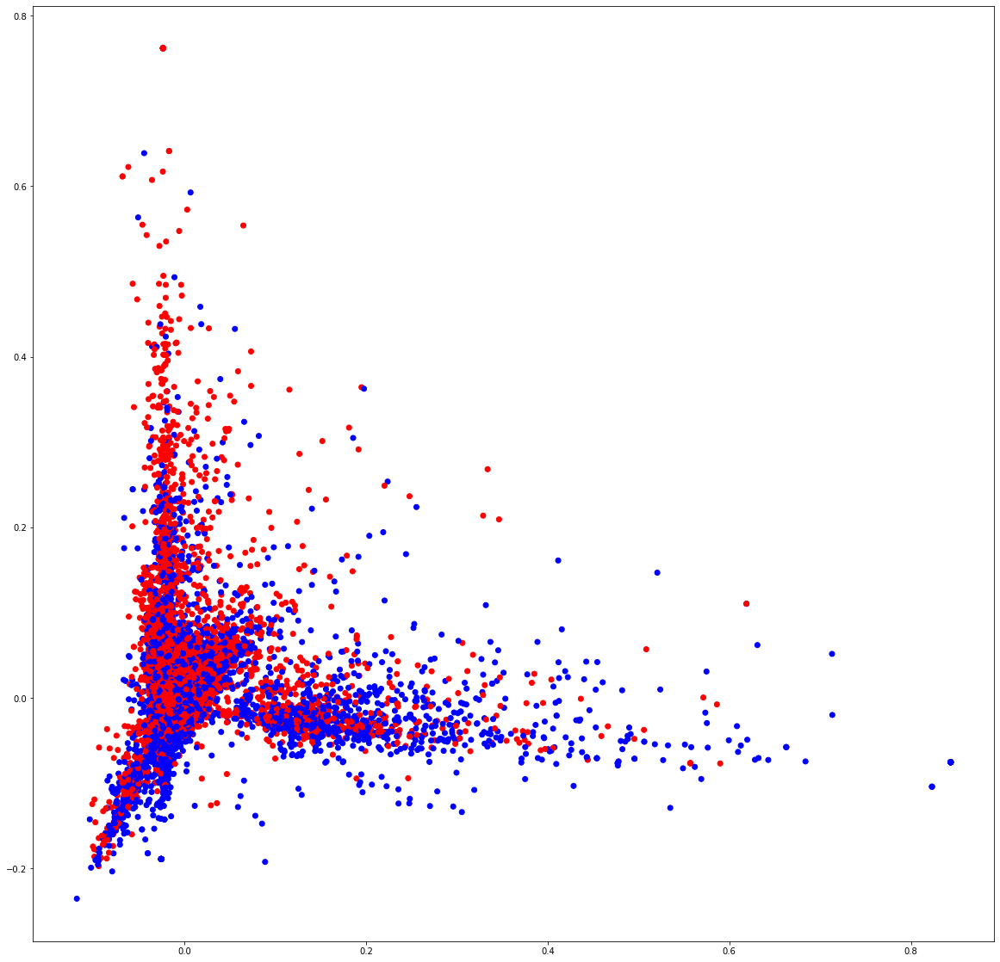

In [44]:

from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
import matplotlib.pyplot as plt

labels_dict = {'Negative':'red', 'Neutral':'gray', 'Positive':'blue'}

def convert_labels(label):
    return labels_dict[label]

first_K_targets = shuffled_df.head(K).label.apply(lambda x: convert_labels(x))


pipeline = Pipeline([
    ('vect', CountVectorizer()),
    ('tfidf', TfidfTransformer()),
])        
X = pipeline.fit_transform(first_K_tweets).todense()

pca = PCA(n_components=2).fit(X)
data2D = pca.transform(X)
plt.figure(figsize = (20, 20))
plt.scatter(data2D[:,0], data2D[:,1], c=first_K_targets)
plt.show()

# Training

### LSTM

In [42]:
from tensorflow.keras.layers import Conv1D, Bidirectional, LSTM, Dense, Input, Dropout
from tensorflow.keras.layers import SpatialDropout1D
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau

In [43]:
sequence_input = Input(shape=(30,), dtype='int32')
embedding_sequences = embedding_layer(sequence_input)
x = SpatialDropout1D(0.2)(embedding_sequences)
x = Conv1D(64, 5, activation='relu')(x)
x = Bidirectional(LSTM(64, dropout=0.2, recurrent_dropout=0.2))(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(512, activation='relu')(x)
outputs = Dense(1, activation='sigmoid')(x)
model = tf.keras.Model(sequence_input, outputs)


model.compile(optimizer=Adam(learning_rate=1e-3), loss='binary_crossentropy', metrics=['accuracy'])
ReduceLROnPlateau = ReduceLROnPlateau(factor=0.1, min_lr = 0.01, monitor = 'val_loss', verbose = 1)

print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  0


In [44]:
history = model.fit(X_train, y_train, batch_size=512, epochs=10, validation_data=(X_test, y_test), callbacks=[ReduceLROnPlateau])

Epoch 1/10
2489/2489 [==============================] - 887s 354ms/step - loss: 0.5378 - accuracy: 0.7247 - val_loss: 0.4957 - val_accuracy: 0.7596
Epoch 2/10
2489/2489 [==============================] - 785s 315ms/step - loss: 0.4859 - accuracy: 0.7636 - val_loss: 0.4719 - val_accuracy: 0.7746
Epoch 3/10
2489/2489 [==============================] - 920s 369ms/step - loss: 0.4737 - accuracy: 0.7724 - val_loss: 0.4623 - val_accuracy: 0.7788
Epoch 4/10
2489/2489 [==============================] - 861s 346ms/step - loss: 0.4674 - accuracy: 0.7759 - val_loss: 0.4655 - val_accuracy: 0.7789
Epoch 5/10
2489/2489 [==============================] - 828s 333ms/step - loss: 0.4612 - accuracy: 0.7797 - val_loss: 0.4603 - val_accuracy: 0.7797
Epoch 6/10
2489/2489 [==============================] - 770s 309ms/step - loss: 0.4589 - accuracy: 0.7818 - val_loss: 0.4557 - val_accuracy: 0.7830
Epoch 7/10
2489/2489 [==============================] - 740s 297ms/step - loss: 0.4563 - accuracy: 0.7830 - val_

In [45]:
model.save('models/lstm_model.h5')

In [7]:
import numpy as np
import re
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.preprocessing import LabelEncoder

from tensorflow.keras.layers import Conv1D, Bidirectional, LSTM, Dense, Input, Dropout
from tensorflow.keras.layers import SpatialDropout1D
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau
import tensorflow as tf

model = tf.keras.models.load_model('models/lstm_model.h5')
model2 = tf.keras.models.load_model('models/lstm_model_1024batchsize.h5')

# Check its architecture
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 30)]              0         
_________________________________________________________________
embedding (Embedding)        (None, 30, 300)           87137400  
_________________________________________________________________
spatial_dropout1d (SpatialDr (None, 30, 300)           0         
_________________________________________________________________
conv1d (Conv1D)              (None, 26, 64)            96064     
_________________________________________________________________
bidirectional (Bidirectional (None, 128)               66048     
_________________________________________________________________
dense (Dense)                (None, 512)               66048     
_________________________________________________________________
dropout (Dropout)            (None, 512)               0     

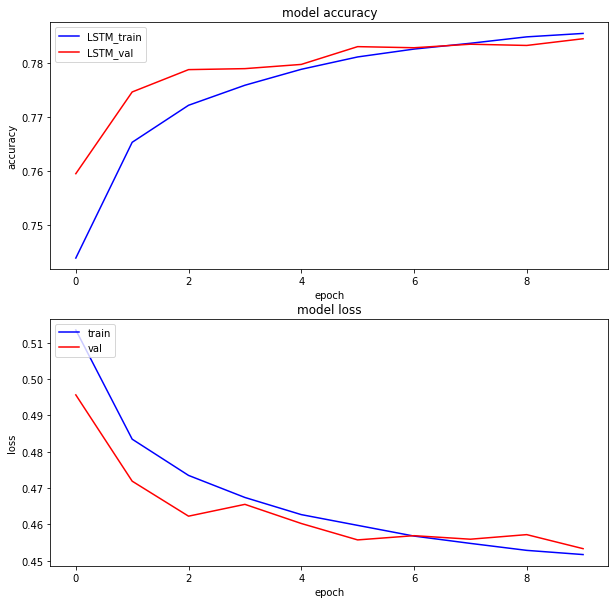

In [60]:
import matplotlib.pyplot as plt

plt1, (plt2, plt3) = plt.subplots(2,1, figsize=(10,10))
plt2.plot(history.history['accuracy'], c= 'blue')
plt2.plot(history.history['val_accuracy'], c='red')
plt2.set_title('model accuracy')
plt2.set_ylabel('accuracy')
plt2.set_xlabel('epoch')
plt2.legend(['LSTM_train', 'LSTM_val'], loc='upper left')

plt3.plot(history.history['loss'], c='blue')
plt3.plot(history.history['val_loss'], c='red')
plt3.set_title('model loss')
plt3.set_ylabel('loss')
plt3.set_xlabel('epoch')
plt3.legend(['train', 'val'], loc='upper left')

In [46]:
def decode_labels(score):
    return "Positive" if score > 0.5 else "Negative"


scores = model.predict(X_test, verbose=1, batch_size=10000)
y_pred = [decode_labels(score) for score in scores]

32/32 [==============================] - 43s 1s/step


### Confusion Matrix

[[125526  33967]
 [ 34675 124298]]


<AxesSubplot:>

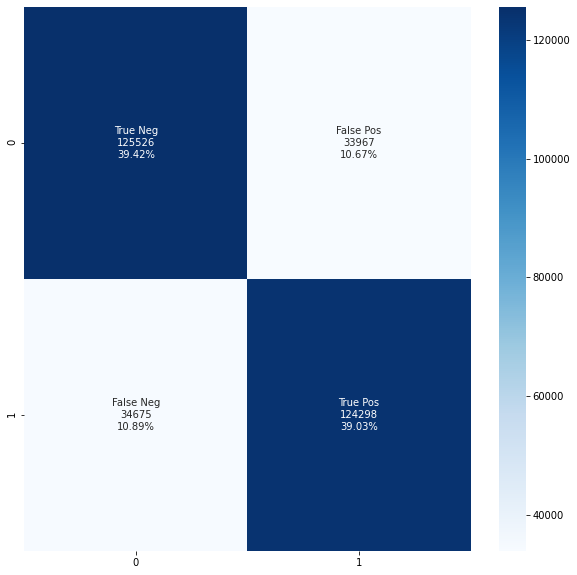

In [46]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
import seaborn as sns

cf_matrix = confusion_matrix(test_data.label.to_list(), y_pred)
print(cf_matrix)

plt.figure(figsize = (10,10))

labels = ['True Neg','False Pos','False Neg','True Pos']
labels = np.asarray(labels).reshape(2,2)
group_names = ['True Neg','False Pos','False Neg','True Pos']
group_counts = ["{0:0.0f}".format(value) for value in cf_matrix.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in cf_matrix.flatten()/np.sum(cf_matrix)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
sns.heatmap(cf_matrix, annot=labels, fmt='', cmap='Blues')

In [47]:
print(classification_report(list(test_data.label), y_pred))

              precision    recall  f1-score   support

    Negative       0.78      0.79      0.79    159493
    Positive       0.79      0.78      0.78    158973

    accuracy                           0.78    318466
   macro avg       0.78      0.78      0.78    318466
weighted avg       0.78      0.78      0.78    318466



In [58]:
def decode_labels(score):
    return "Positive" if score > 0.5 else "Negative"

scores2 = model2.predict(X_test, verbose=1, batch_size=10000)
y_pred2 = [decode_labels(score) for score in scores]

32/32 [==============================] - 35s 1s/step


[[128553  30940]
 [ 38435 120538]]


<AxesSubplot:>

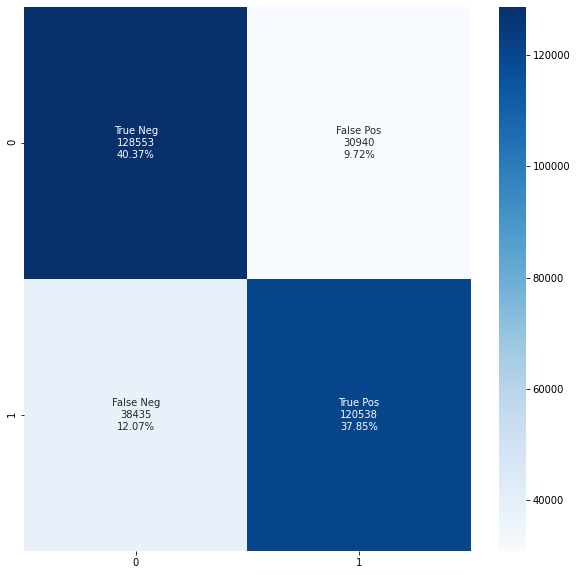

In [59]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
import seaborn as sns

cf_matrix = confusion_matrix(test_data.label.to_list(), y_pred2)
print(cf_matrix)

plt.figure(figsize = (10,10))

labels = ['True Neg','False Pos','False Neg','True Pos']
labels = np.asarray(labels).reshape(2,2)
group_names = ['True Neg','False Pos','False Neg','True Pos']
group_counts = ["{0:0.0f}".format(value) for value in cf_matrix.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in cf_matrix.flatten()/np.sum(cf_matrix)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
sns.heatmap(cf_matrix, annot=labels, fmt='', cmap='Blues')

In [60]:
print(classification_report(list(test_data.label), y_pred2))

              precision    recall  f1-score   support

    Negative       0.77      0.81      0.79    159493
    Positive       0.80      0.76      0.78    158973

    accuracy                           0.78    318466
   macro avg       0.78      0.78      0.78    318466
weighted avg       0.78      0.78      0.78    318466



## ROC - AUC

In [49]:
from sklearn.metrics import roc_curve
y_pred_lstm1 = model.predict(X_test).ravel()
fpr_lstm1, tpr_lstm1, thresholds_lstm1 = roc_curve(y_test, y_pred_lstm1)
y_pred_lstm2 = model2.predict(X_test).ravel()
fpr_lstm2, tpr_lstm2, thresholds_lstm2 = roc_curve(y_test, y_pred_lstm2)

In [50]:
#AUC calculation
from sklearn.metrics import auc
auc_lstm1 = auc(fpr_lstm1, tpr_lstm1)
auc_lstm2 = auc(fpr_lstm2, tpr_lstm2)

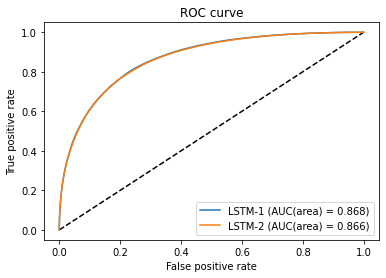

In [53]:
plt.figure(1)
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr_lstm1, tpr_lstm1, label='LSTM-1 (AUC(area) = {:.3f})'.format(auc_lstm1))
plt.plot(fpr_lstm2, tpr_lstm2, label='LSTM-2 (AUC(area) = {:.3f})'.format(auc_lstm2))
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend(loc='best')
plt.show()